**Remove Common Word adn Analyze Product in Amazon Food Review into Bad Store and Good Store**


In this project, data from Kaggle, consisting of food reviews spanning a period of 10 years, is used and accessed via the provided link (https://www.kaggle.com/datasets/snap/amazon-fine-food-reviews). In this section, word clouds will be generated for each star level (from 1 to 5), with a focus on removing **common words** among them. Products from the "candy" and "pet" categories will be selected as examples. Stores will then be classified as either "Bad Store" or "Good Store" based on the sentiment of the review text and the review scores provided by customers. Once the classification is completed, products that are not selling well in good stores will be identified. Recommendations regarding possible marketing strategies, such as implementing flash sales for these products, will then be made to Amazon. Furthermore, the best-selling products in bad stores will be identified using word clouds, with the most frequently appearing words, or those displayed more prominently, being suggested to bad stores as areas for improvement.

Read data

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Clean data

In [ ]:
import pandas as pd

# Specify the .csv file path
csv_file_path = '/content/drive/MyDrive/Study/NTUST/Big Data Analytic/Me/MidTerm/Reviews_withURL.csv'  # Update with your actual file path

# Read the .csv file into a DataFrame
df = pd.read_csv(csv_file_path)

# Now you can use the DataFrame 'df' to work with the data from the .csv file

Clean data in "Text" column

In [ ]:
#Delete Unnamed: and ProductURL column
# Drop the "Unnamed:" column
df.drop('Unnamed: 0', axis=1, inplace=True)

# Get the number of rows in the original DataFrame
original_rows = df.shape[0]

# Drop duplicate rows based on the "Text" column and keep the first occurrence
df.drop_duplicates(subset='Text', keep='first', inplace=True)

# Get the number of rows in the deduplicated DataFrame
deduplicated_rows = df.shape[0]

# Print the number of rows in the original and deduplicated DataFrames
print("Number of rows in the original DataFrame: ", original_rows)
print("Number of rows in the deduplicated DataFrame: ", deduplicated_rows)

Number of rows in the original DataFrame:  568454
Number of rows in the deduplicated DataFrame:  393579


In [ ]:
df.head(3)

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,ProductURL
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,https://www.amazon.com/dp/B001E4KFG0
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,https://www.amazon.com/dp/B00813GRG4
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,https://www.amazon.com/dp/B000LQOCH0


Clean data in "Text" column

In [ ]:
#set of stopwords
import re
import nltk
nltk.download('stopwords')

from nltk.corpus import stopwords
stop = set(stopwords.words('english'))

#initialising the snowball stemmer
sno = nltk.stem.SnowballStemmer('english')


#function to clean the word of any html-tags
def cleanhtml(sentence):
    cleanr = re.compile('<.*?>')
    cleantext = re.sub(cleanr, ' ', sentence)
    return cleantext

#function to clean the word of any punctuation or special characters
def cleanpunc(sentence):
    cleaned = re.sub(r'[?|!|\'|"|#]',r'',sentence)
    cleaned = re.sub(r'[.|,|)|(|\|/]',r' ',cleaned)
    return  cleaned


#function to text summarization
def final_sentence(text):

    text = text.split()
    text = [cleanhtml(x) for x in text]
    text = [cleanpunc(x) for x in text]

    def test(word):
        if word.isalpha() and len(word) > 2 and word.lower() not in stop:
            s=(sno.stem(word.lower()))
            return s
        else:
            pass

    text = [test(x) for x in text if test(x)]

    return ' '.join(text)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
df.shape

from tqdm import tqdm
tqdm.pandas()

df['CleanedText'] = df['Text'].progress_apply(final_sentence)
print(df.shape)
df.head()



100%|██████████| 393579/393579 [09:19<00:00, 703.07it/s]

(393579, 12)


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,ProductURL,CleanedText
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,https://www.amazon.com/dp/B001E4KFG0,bought sever vital can dog food product found ...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,https://www.amazon.com/dp/B00813GRG4,product arriv label jumbo salt peanut actual s...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,https://www.amazon.com/dp/B000LQOCH0,confect around pillowi citrus gelatin nut case...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,https://www.amazon.com/dp/B000UA0QIQ,look secret ingredi robitussin believ found go...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,https://www.amazon.com/dp/B006K2ZZ7K,great taffi great wide assort yummi deliveri t...


In [ ]:
import pandas as pd

# Specify the .csv file path
csv_file_path = '/content/drive/MyDrive/Study/NTUST/Big Data Analytic/Me/MidTerm/Tokenized.csv'  # Update with your actual file path

# Read the .csv file into a DataFrame
df1 = pd.read_csv(csv_file_path)

# Now you can use the DataFrame 'df' to work with the data from the .csv file

In [ ]:
df1.head(3)

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,ProductURL,CleanedText
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,https://www.amazon.com/dp/B001E4KFG0,bought sever vital can dog food product found ...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,https://www.amazon.com/dp/B00813GRG4,product arriv label jumbo salt peanut actual s...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,https://www.amazon.com/dp/B000LQOCH0,confect around pillowi citrus gelatin nut case...


Average Score by Year

Time  Score
1999  5            4
2000  1            1
      4            1
      5           15
2001  1            1
               ...  
2012  1        14463
      2         7933
      3        10970
      4        19911
      5        85808
Name: Score, Length: 62, dtype: int64


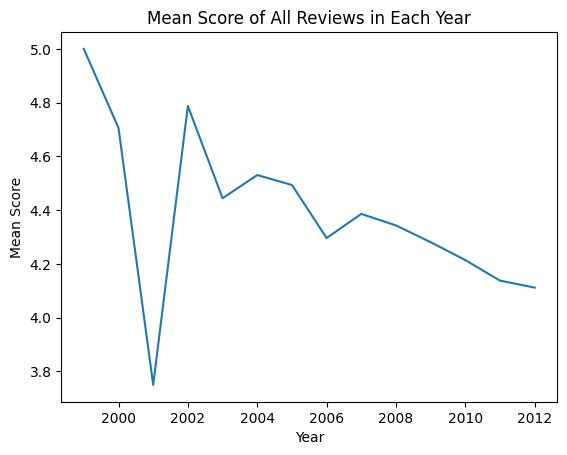

In [ ]:
 import matplotlib.pyplot as plt
 import pandas as pd

df1['Time'] = pd.to_datetime(df1['Time'], unit='s').dt.year

score_counts = df1.groupby(['Time', 'Score'])['Score'].count()
print(score_counts)

mean_score = df1.groupby('Time')['Score'].mean()

plt.plot(mean_score.index, mean_score.values)
plt.xlabel('Year')
plt.ylabel('Mean Score')
plt.title('Mean Score of All Reviews in Each Year')
plt.show()

Time
1999         4
2000        17
2001         8
2002        33
2003        99
2004       439
2005      1059
2006      4722
2007     15752
2008     23100
2009     37866
2010     57967
2011    113428
2012    139085
Name: UserId, dtype: int64


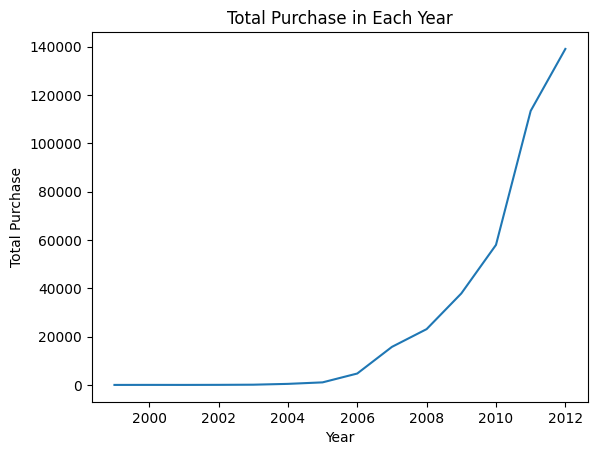

In [ ]:
total_purchase_counts = df1.groupby('Time')['UserId'].count()
print(total_purchase_counts)

plt.plot(total_purchase_counts.index, total_purchase_counts.values)
plt.xlabel('Year')
plt.ylabel('Total Purchase')
plt.title('Total Purchase in Each Year')
plt.show()

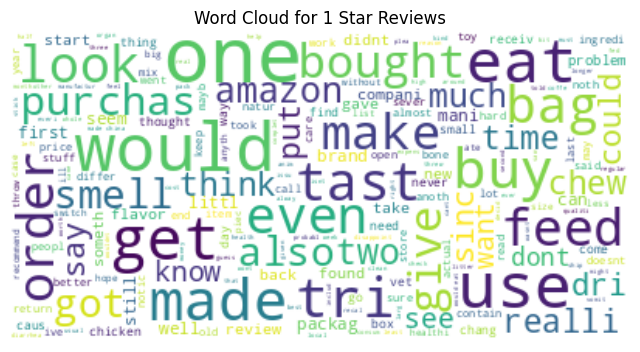

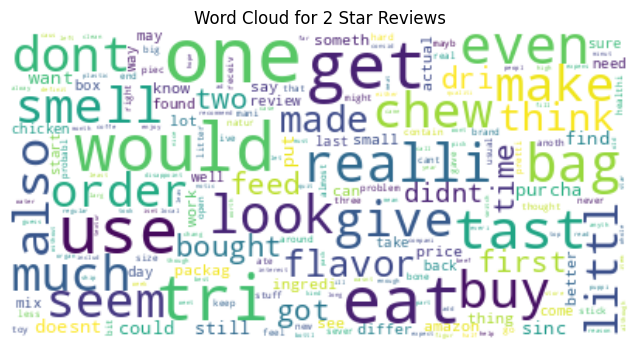

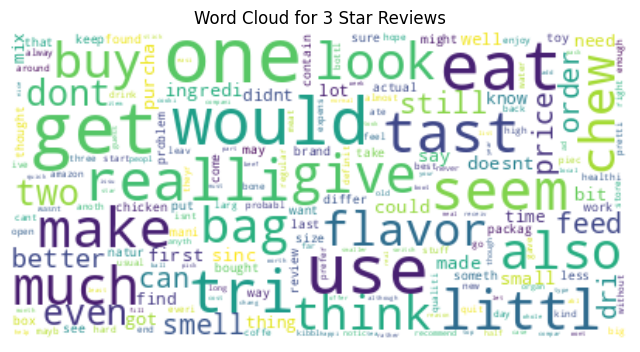

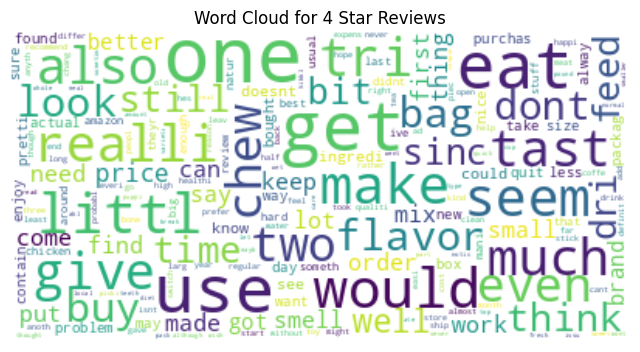

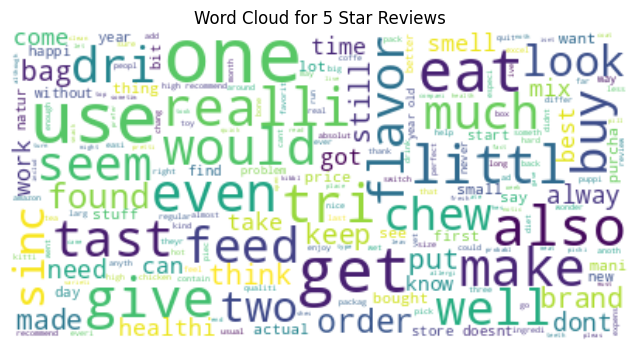

In [ ]:
#Nomer 4
from wordcloud import WordCloud


# Drop the rows with missing or NaN values in the "CleanedText" column
df1 = df1.dropna(subset=['CleanedText'])

# Filter the reviews related to pet food
pet_df = df1[df1['CleanedText'].str.contains('pet|dog|cat|puppy|kitten|animal', case=False)]

# Define custom stopwords to remove common words
stopwords = ['product', 'food', 'treat', 'treats', 'dog', 'dogs', 'puppy', 'puppies', 'cat', 'cats', 'kitten', 'kittens', 'pet', 'pets', 'animal', 'animals', 'good', 'great', 'bad', 'like', 'dislike', 'love', 'hate']

# Generate word clouds for each star level (1 to 5)
for i in range(1, 6):
    # Filter the reviews for the current star level
    reviews = pet_df[pet_df['Score'] == i]['CleanedText']

    # Combine all the reviews into a single string
    text = ' '.join(reviews)

    # Generate the word cloud
    wc = WordCloud(background_color='white', stopwords=stopwords, max_words=200, max_font_size=50, random_state=42).generate(text)

    # Plot the word cloud
    plt.figure(figsize=(8,6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud for {} Star Reviews'.format(i))
    plt.show()


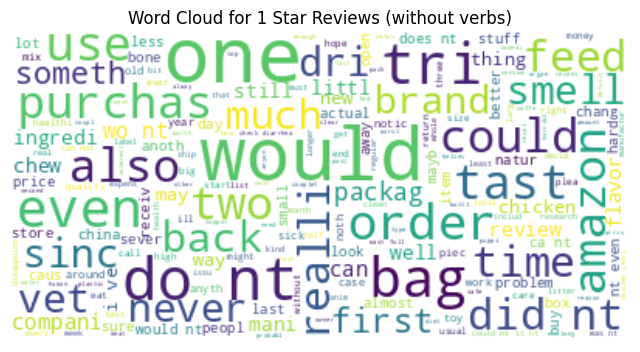

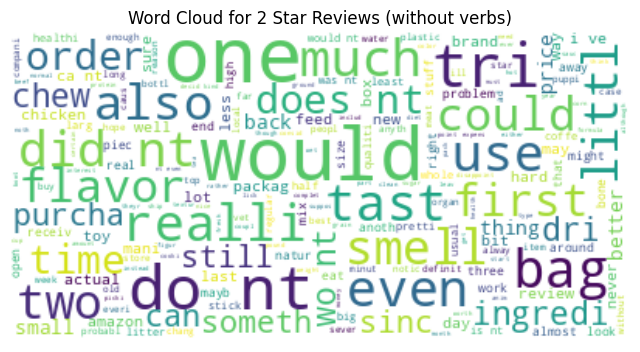

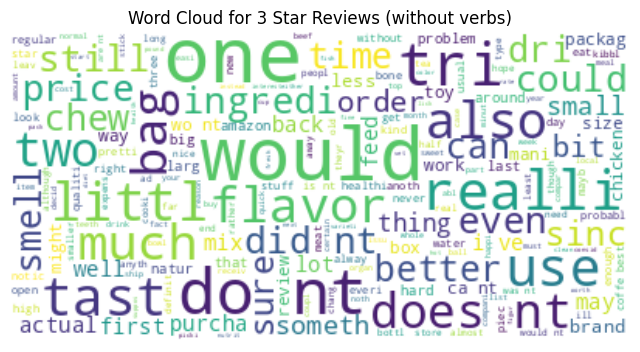

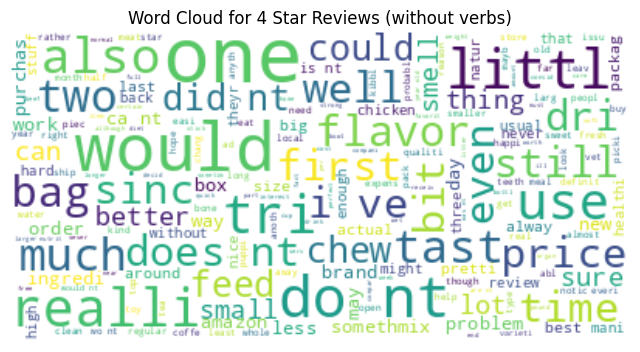

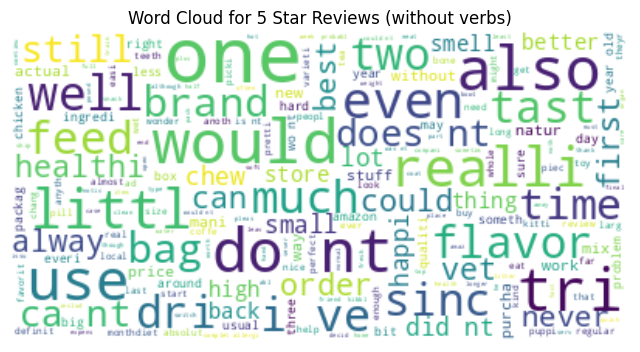

In [ ]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import spacy

# Load the spacy English model
nlp = spacy.load('en_core_web_sm')

# Define function to remove verbs from the text
def remove_verbs(text):
    doc = nlp(text)
    return ' '.join([token.text for token in doc if token.pos_ != 'VERB'])


# Define custom stopwords to remove common words
stopwords = ['product', 'food', 'treat', 'treats', 'dog', 'dogs', 'puppy', 'puppies', 'cat', 'cats', 'kitten', 'kittens', 'pet', 'pets', 'animal', 'animals', 'good', 'great', 'bad', 'like', 'dislike', 'love', 'hate']

# Generate word clouds for each star level (1 to 5)
for i in range(1, 6):
    # Filter the reviews for the current star level
    reviews = pet_df[pet_df['Score'] == i]['CleanedText']

    # Remove verbs from the reviews
    reviews = reviews.apply(lambda x: remove_verbs(x) if isinstance(x, str) else x)

    # Combine all the reviews into a single string
    text = ' '.join(reviews)

    # Generate the word cloud
    wc = WordCloud(background_color='white', stopwords=stopwords, max_words=200, max_font_size=50, random_state=42).generate(text)

    # Plot the word cloud
    plt.figure(figsize=(8,6))
    plt.imshow(wc, interpolation='bilinear')
    plt.axis('off')
    plt.title('Word Cloud for {} Star Reviews (without verbs)'.format(i))
    plt.show()


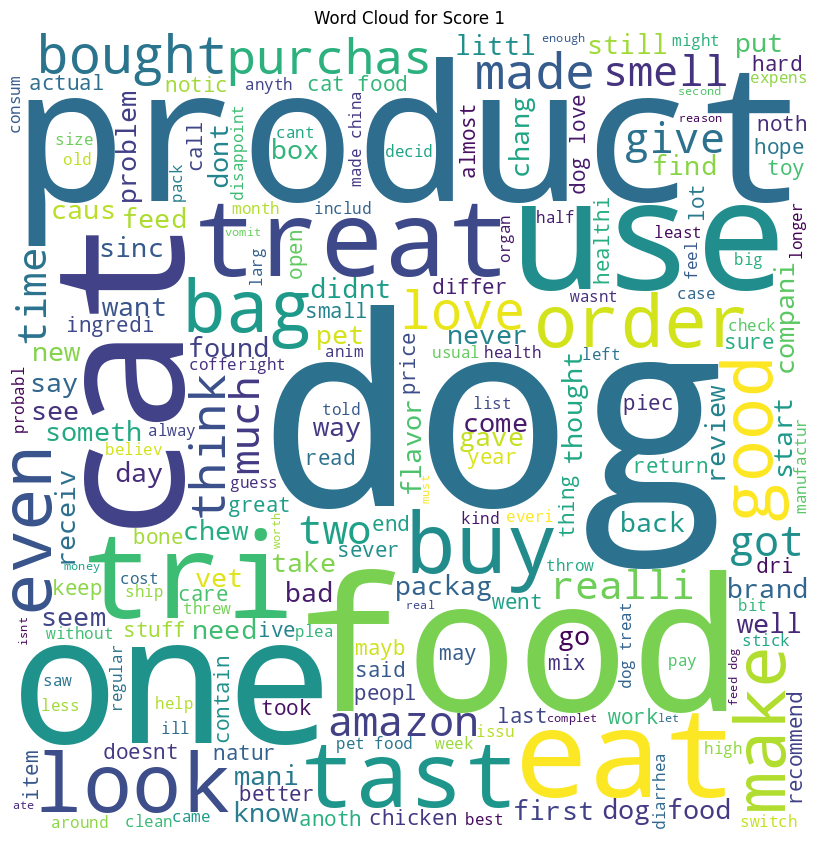

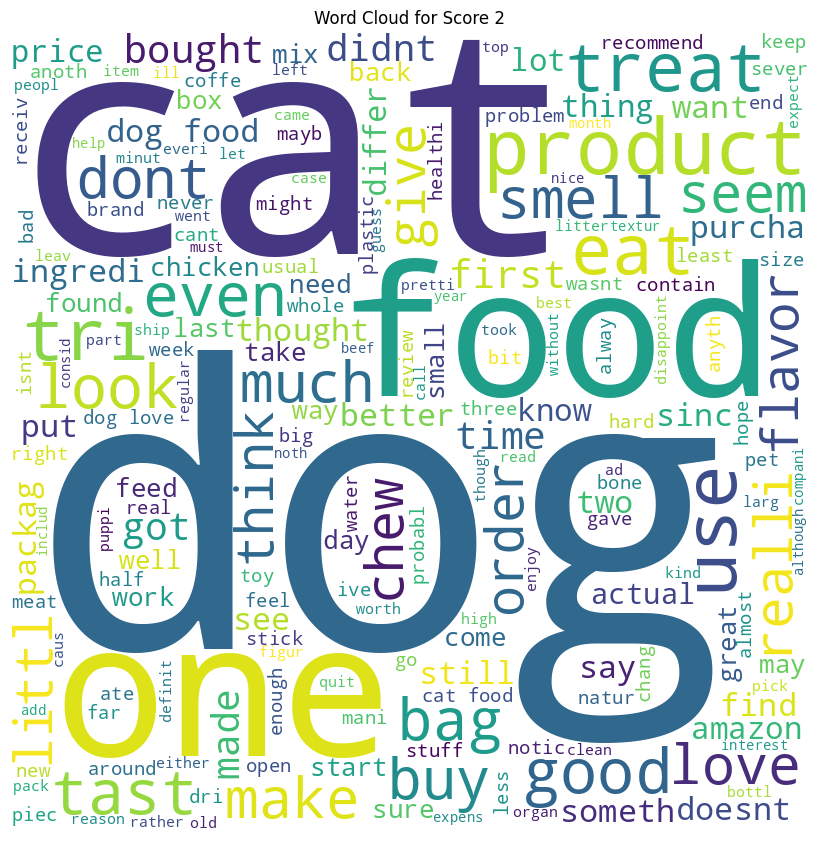

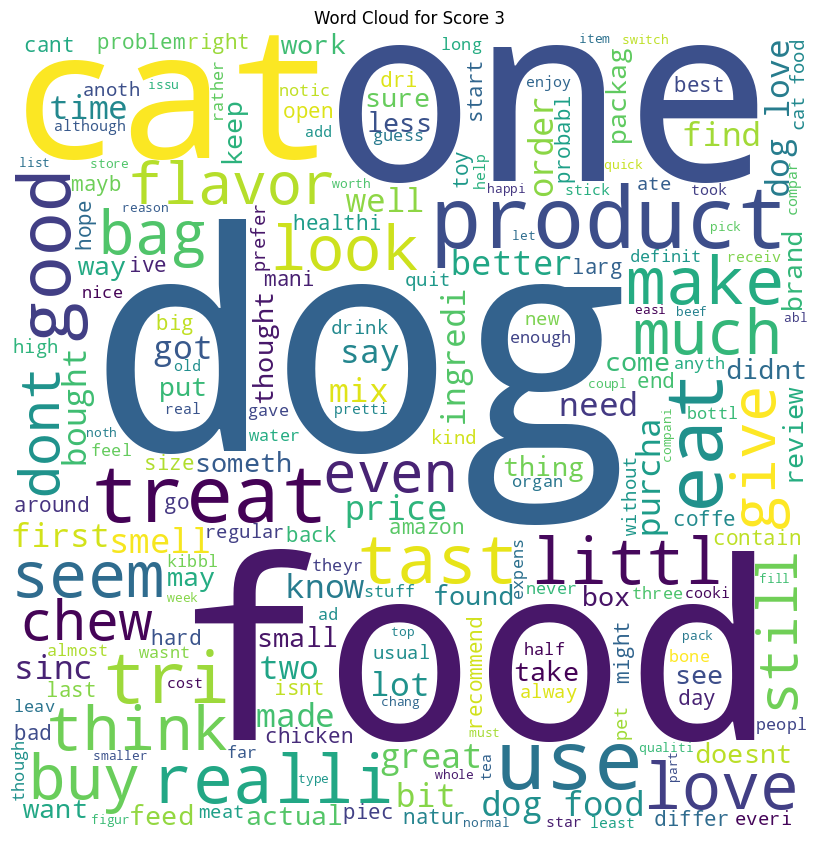

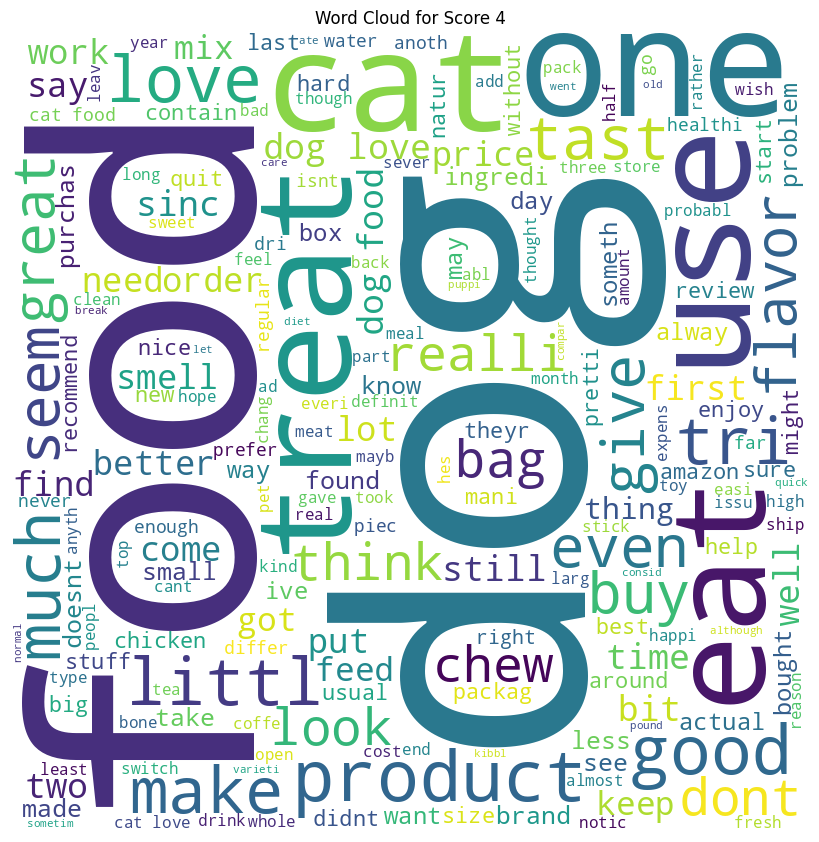

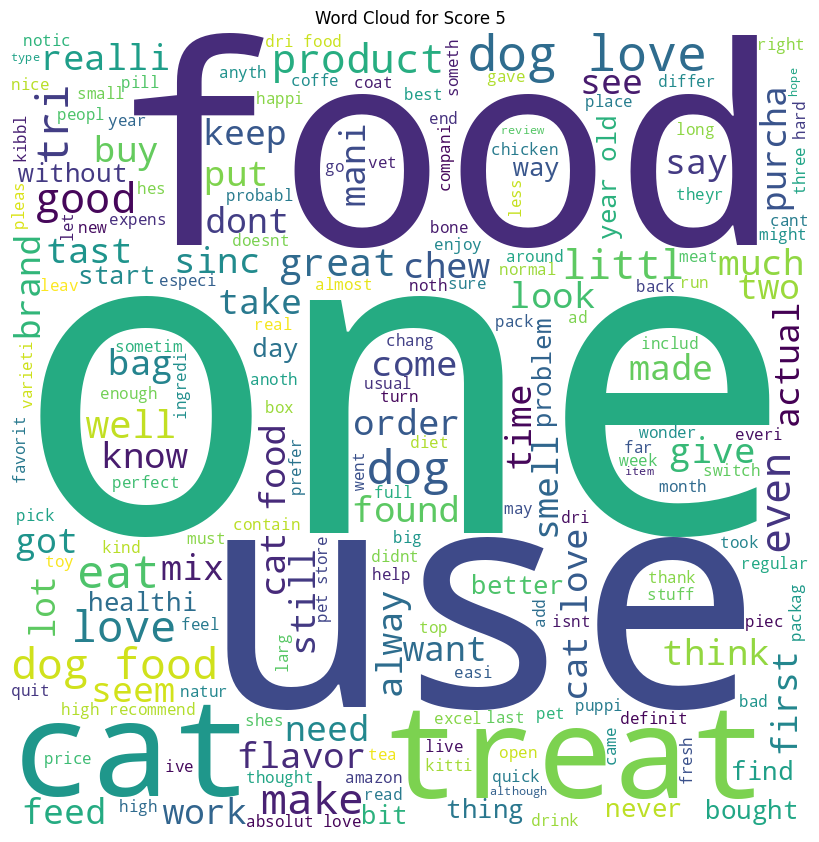

In [ ]:
# Import necessary libraries
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Function to remove common words from two sentences
def removeCommonWords(sent1, sent2):
    # Store the words present in both the sentences
    sentence1 = list(sent1.split())
    sentence2 = list(sent2.split())
    # Calculate frequency of words using Counter() function
    frequency1 = Counter(sentence1)
    frequency2 = Counter(sentence2)
    word = 0
    # Iterate the list consisting of words in the first sentence
    for i in range(len(sentence1)):
        # If word is present in both the strings
        if sentence1[word] in frequency2.keys():
            # Remove the word
            sentence1.pop(word)
            # Decrease the frequency of the word
            word = word - 1
        word += 1
    word = 0
    # Iterate the list consisting of words in the second sentence
    for i in range(len(sentence2)):
        # If word is present in both the strings
        if sentence2[word] in frequency1.keys():
            # Remove the word
            sentence2.pop(word)
            # Decrease the removed word
            word = word - 1
        word += 1
    # Return the remaining words in the two sentences as a tuple
    return (' '.join(sentence1), ' '.join(sentence2))

# Create a dictionary to store cleaned text for each score (1-5)
score_dict = {}
for score in range(1, 6):
    score_dict[score] = ''

# Loop through the dataframe df_pet
for index, row in pet_df.iterrows():
    # Get the score and cleaned text
    score = row['Score']
    cleaned_text = row['CleanedText']
    # Add the cleaned text to the score_dict
    score_dict[score] += cleaned_text + ' '

# Generate word clouds for each score
for score, text in score_dict.items():
    # Generate a word cloud image
    wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                min_font_size = 10).generate(text)

    # Display the generated image
    plt.figure(figsize = (8, 8), facecolor = None)
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.tight_layout(pad = 0)
    plt.title(f"Word Cloud for Score {score}")
    plt.show()


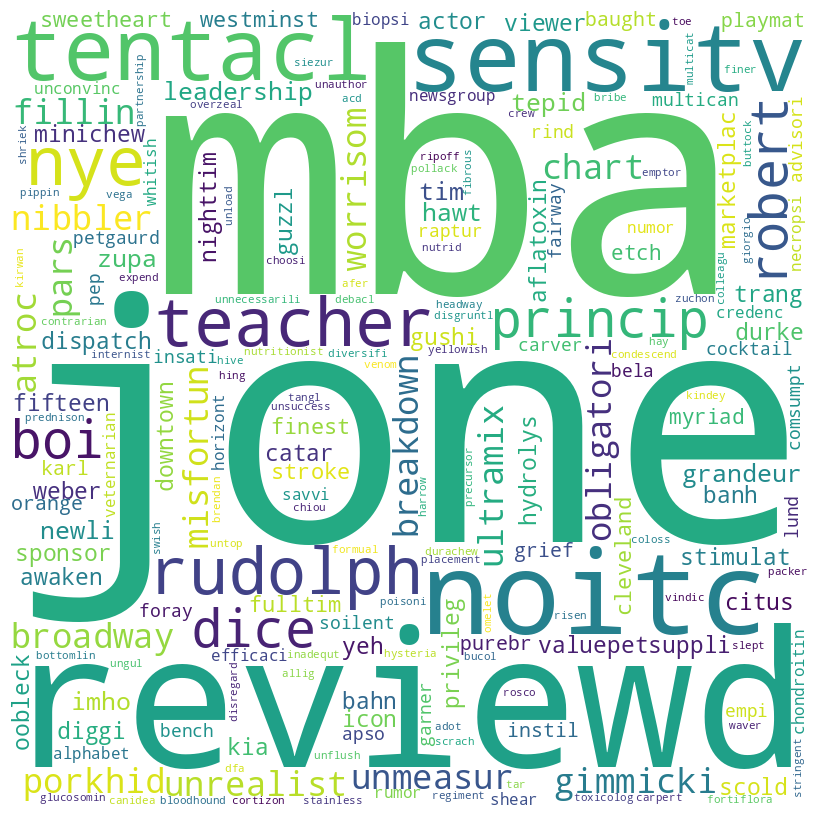

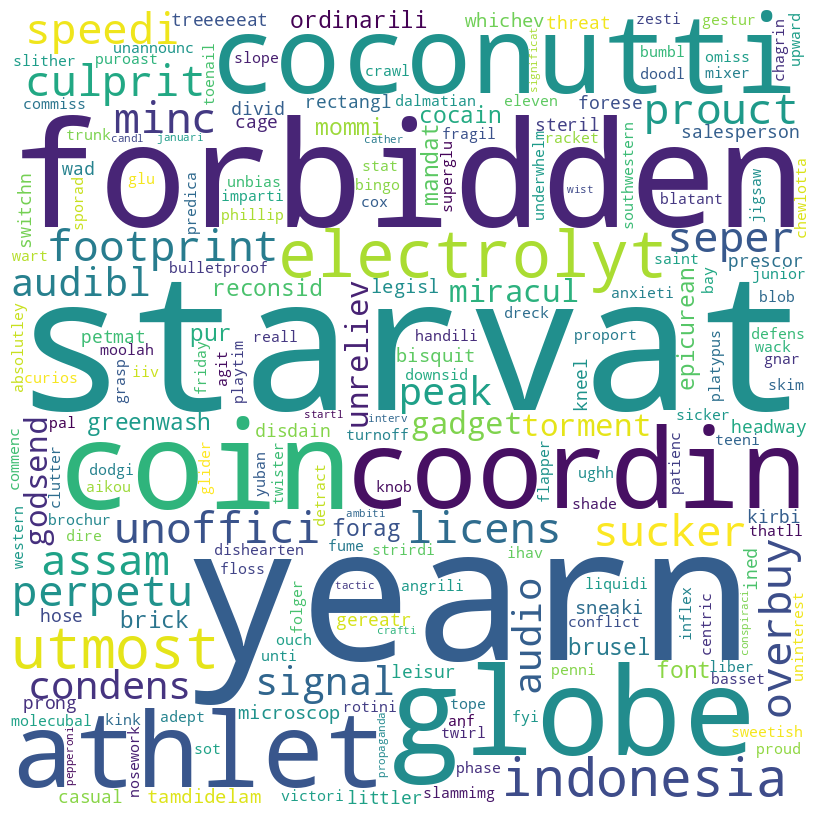

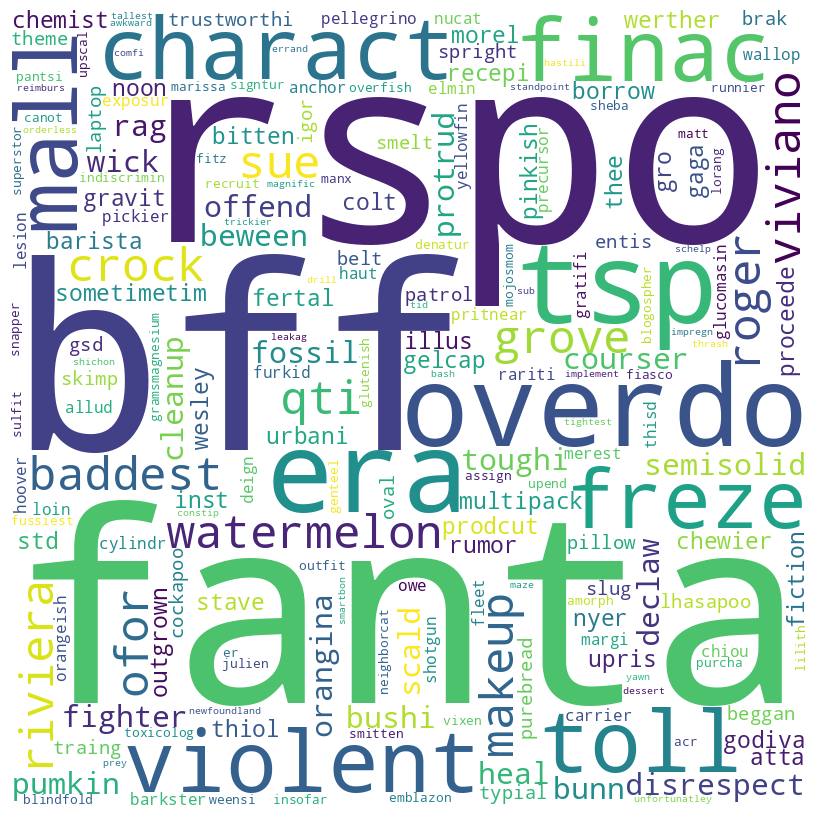

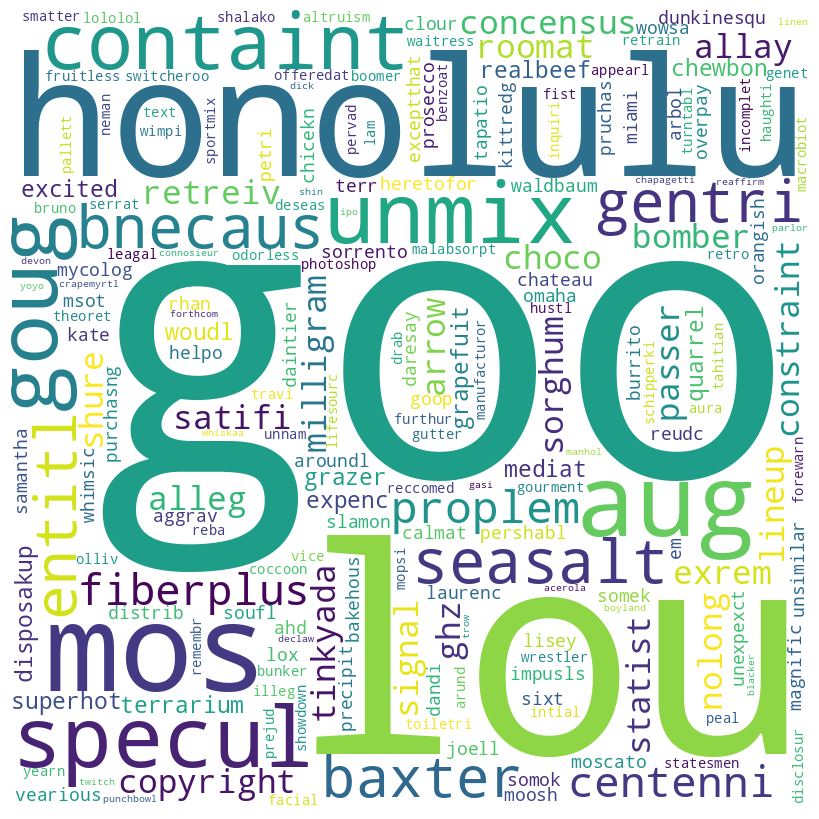

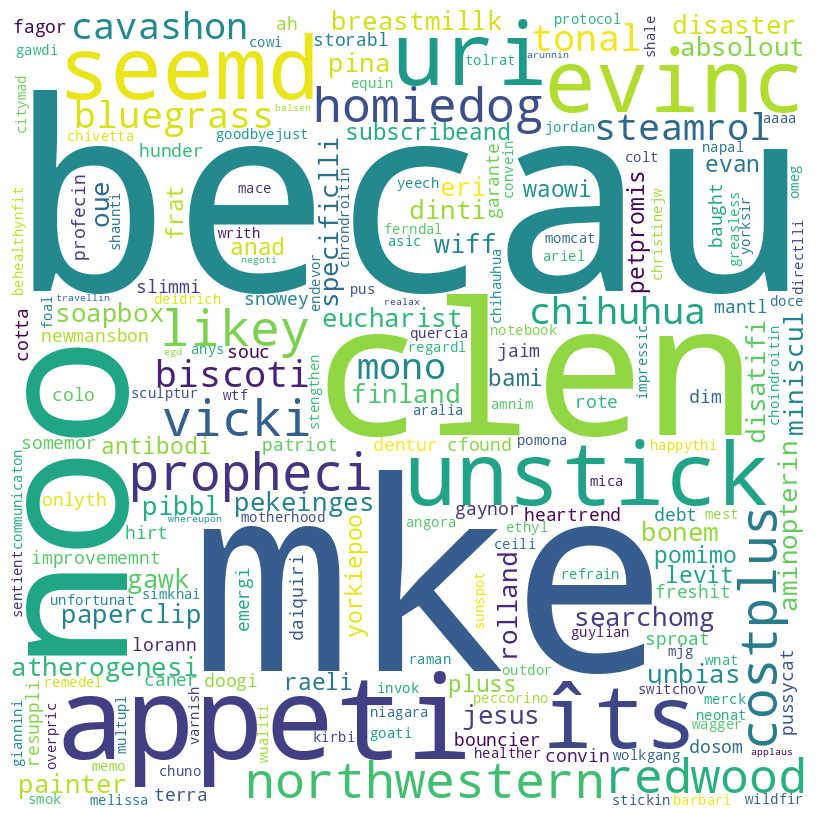

In [ ]:
#result for pet df
# Import necessary libraries
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Filter the reviews related to pet food
pet_df = df1[df1['CleanedText'].str.contains('pet|dog|cat|puppy|kitten|animal', case=False)]

# Function to remove common words from a sentence
def removeCommonWords(sent):
    # Store the words present in the sentence
    sentence = list(sent.split())
    # Calculate frequency of words using Counter() function
    frequency = Counter(sentence)
    # Remove common words from sentence
    sentence = [word for word in sentence if frequency[word] == 1]
    # Return the remaining words in the sentence as a string
    return ' '.join(sentence)

# Loop through the dataframe df_pet for each score
for score in range(1, 6):
    # Filter rows with the current score
    df_score = pet_df[pet_df['Score'] == score]
    # Join all sentences in the 'CleanedText' column into one string
    text = ' '.join(df_score['CleanedText'].tolist())
    # Remove common words from the string
    text = removeCommonWords(text)
    # Generate wordcloud for the current score
    wordcloud = WordCloud(width=800, height=800, background_color='white', min_font_size=10).generate(text)
    # Plot the wordcloud
    plt.figure(figsize=(8, 8), facecolor=None)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.tight_layout(pad=0)
    plt.show()


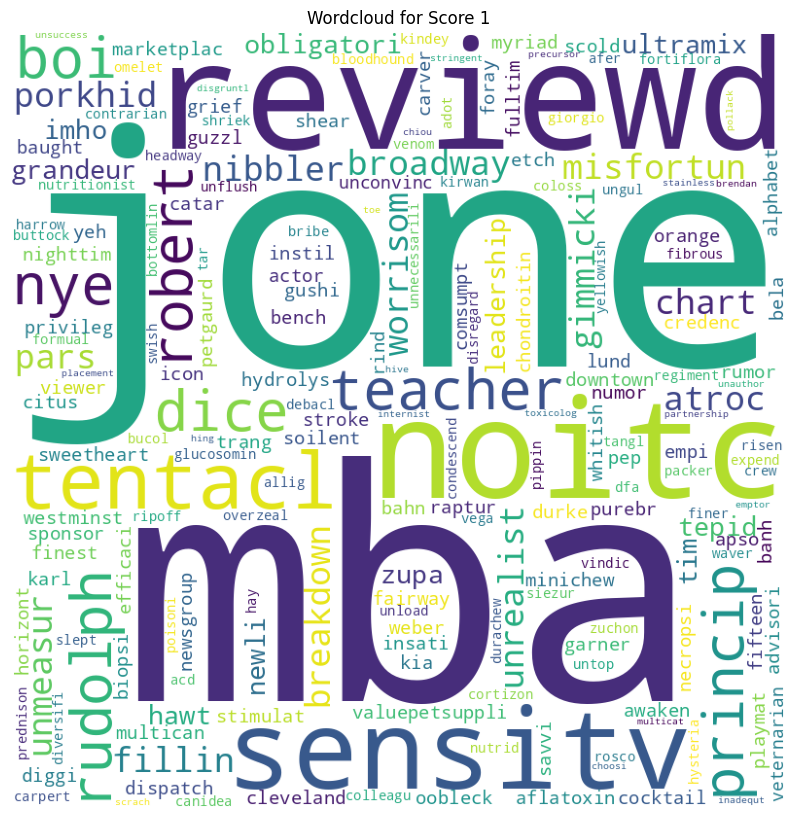

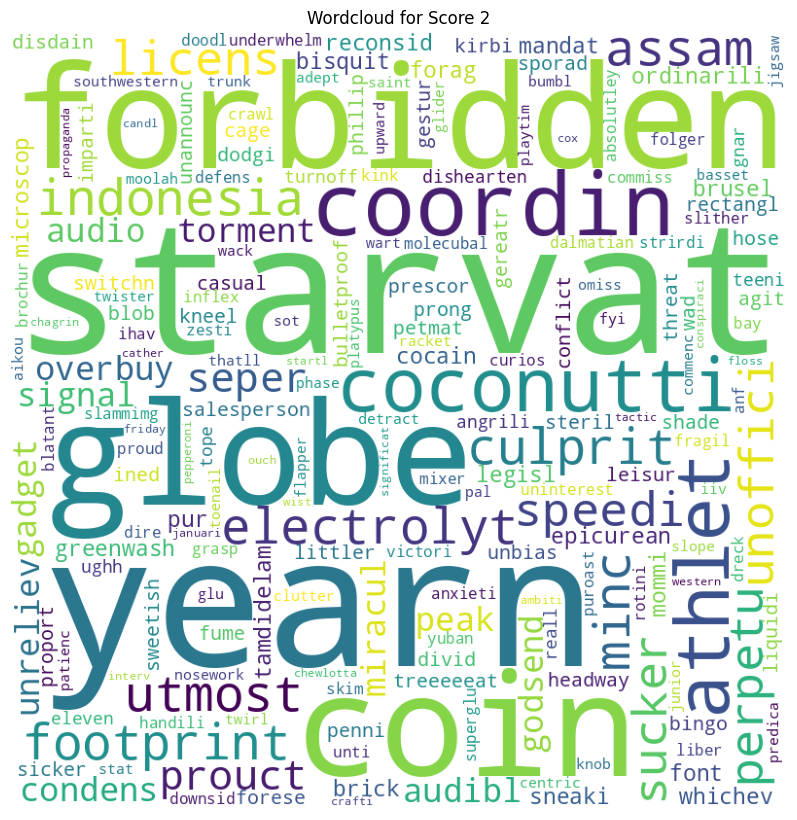

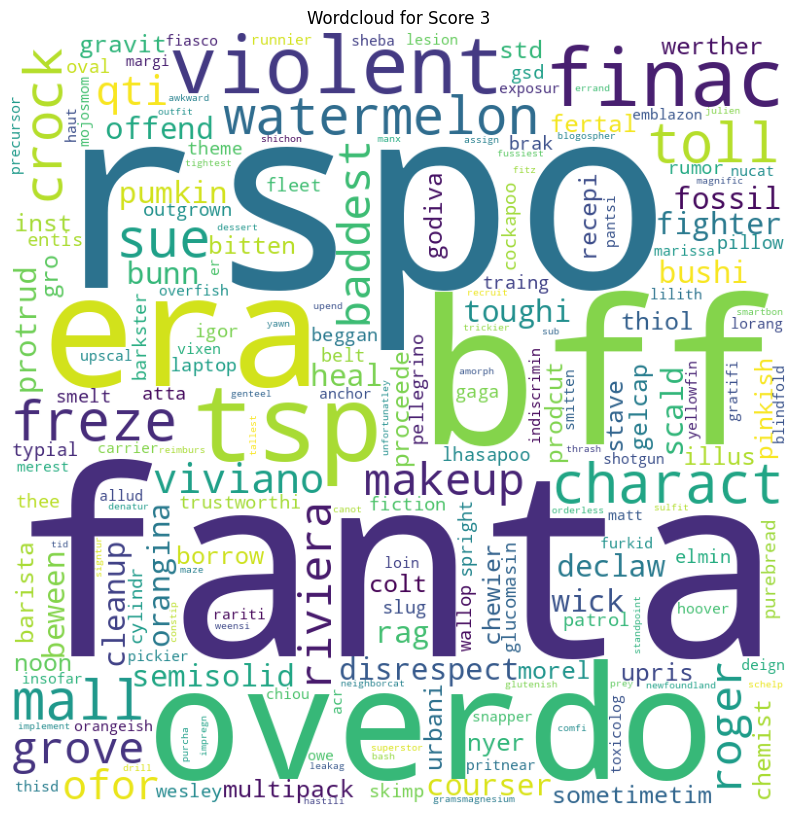

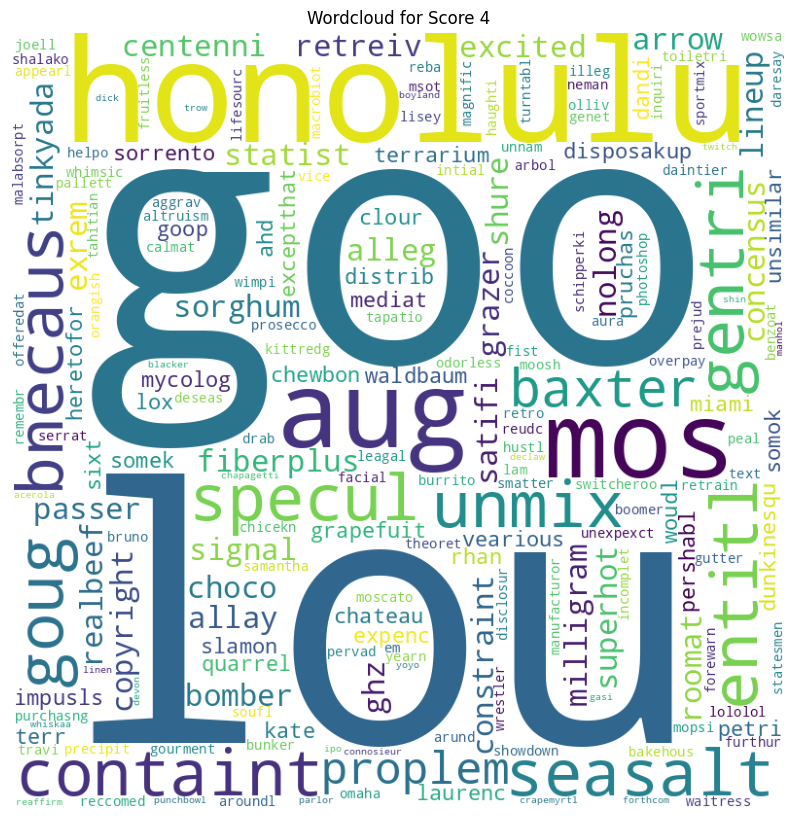

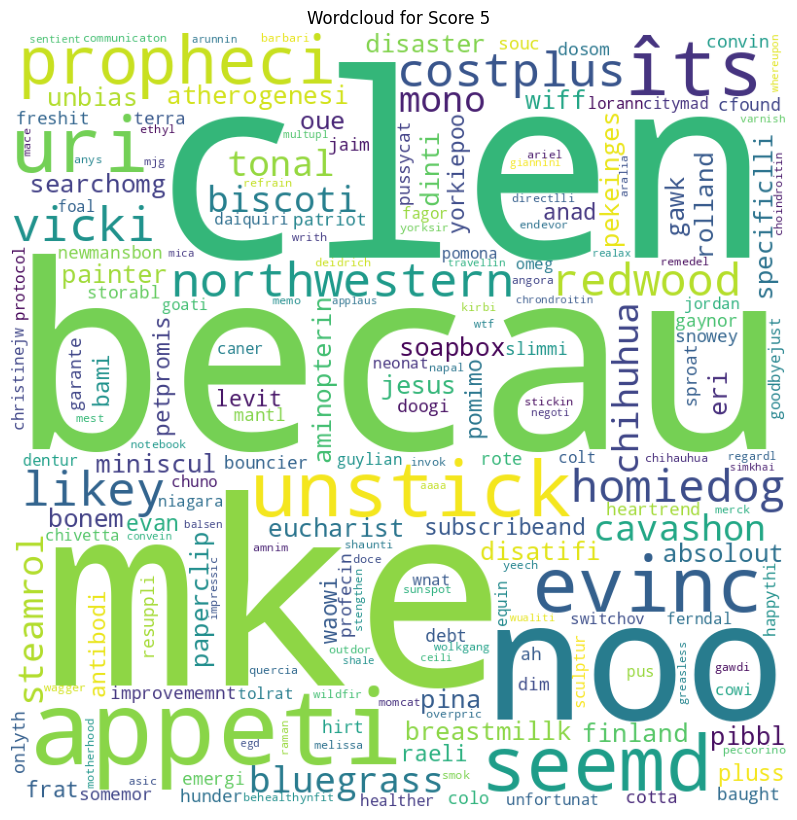

In [ ]:
# Import necessary libraries
from collections import Counter
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Filter the reviews related to pet food
pet_df = df1[df1['CleanedText'].str.contains('pet|dog|cat|puppy|kitten|animal', case=False)]

# Function to remove common words from a sentence
def removeCommonWords(sent):
    # Store the words present in the sentence
    sentence = list(sent.split())
    # Calculate frequency of words using Counter() function
    frequency = Counter(sentence)
    # Remove common words from sentence
    sentence = [word for word in sentence if frequency[word] == 1]
    # Return the remaining words in the sentence as a string
    return ' '.join(sentence)

# Loop through the dataframe df_pet for each score
for score in range(1, 6):
    # Filter rows with the current score
    df_score = pet_df[pet_df['Score'] == score]
    # Join all sentences in the 'CleanedText' column into one string
    text = ' '.join(df_score['CleanedText'].tolist())
    # Remove common words from the string
    text = removeCommonWords(text)
    # Generate wordcloud for the current score
    wordcloud = WordCloud(width=800, height=800, background_color='white', min_font_size=10).generate(text)
    # Plot the wordcloud with a title
    plt.figure(figsize=(8, 8), facecolor=None)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title(f"Wordcloud for Score {score}")
    plt.tight_layout(pad=0)
    plt.show()


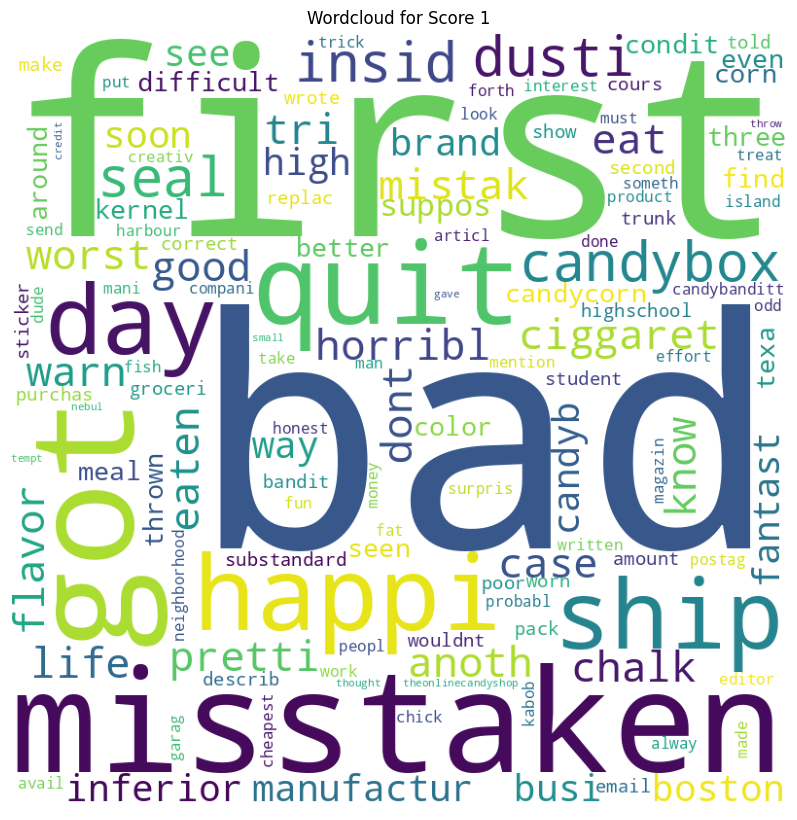

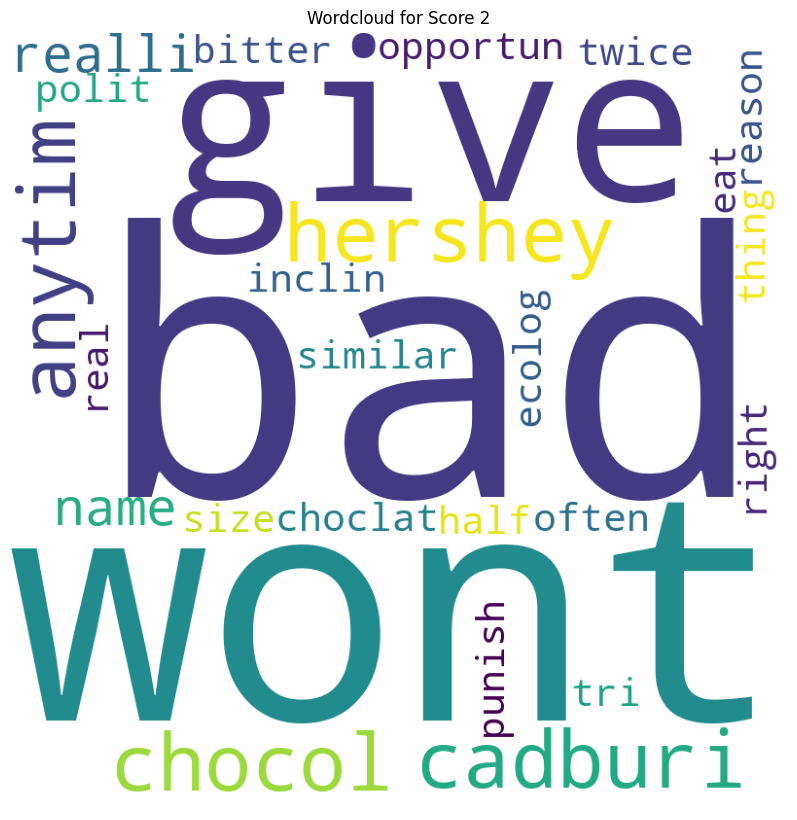

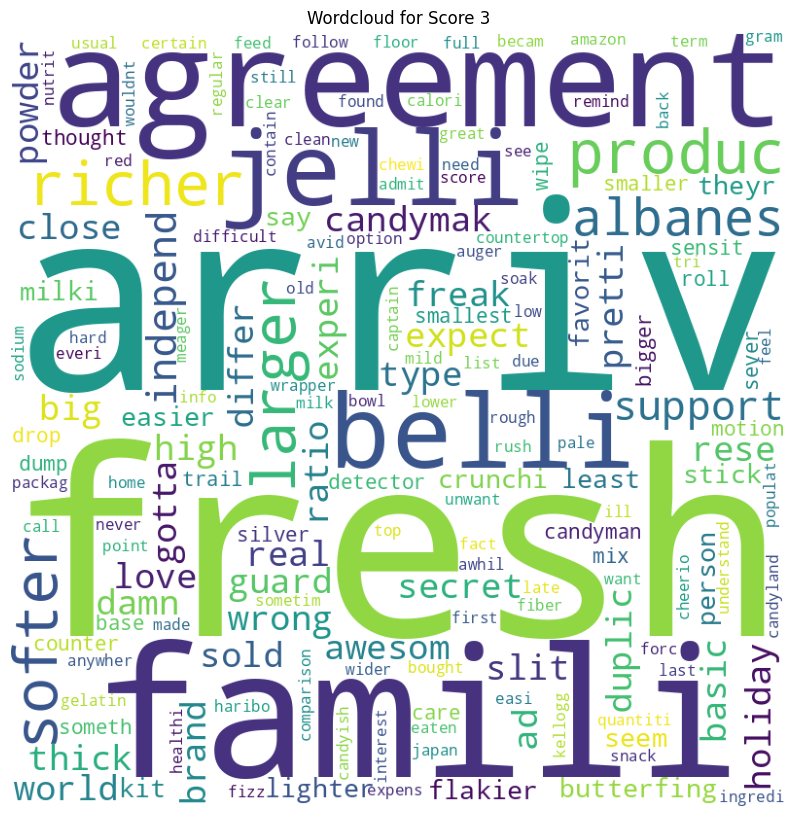

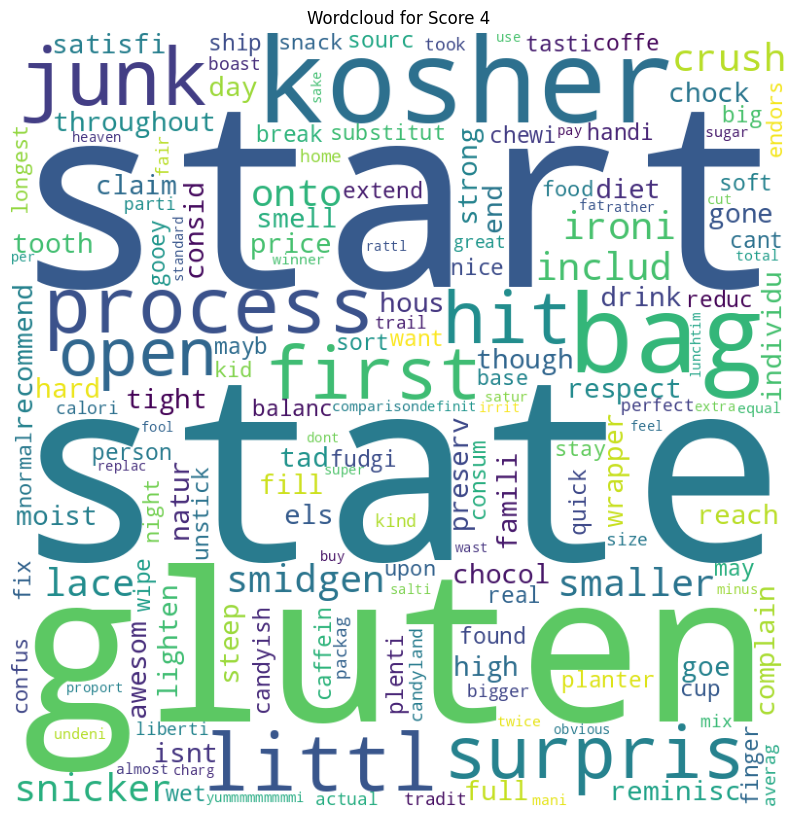

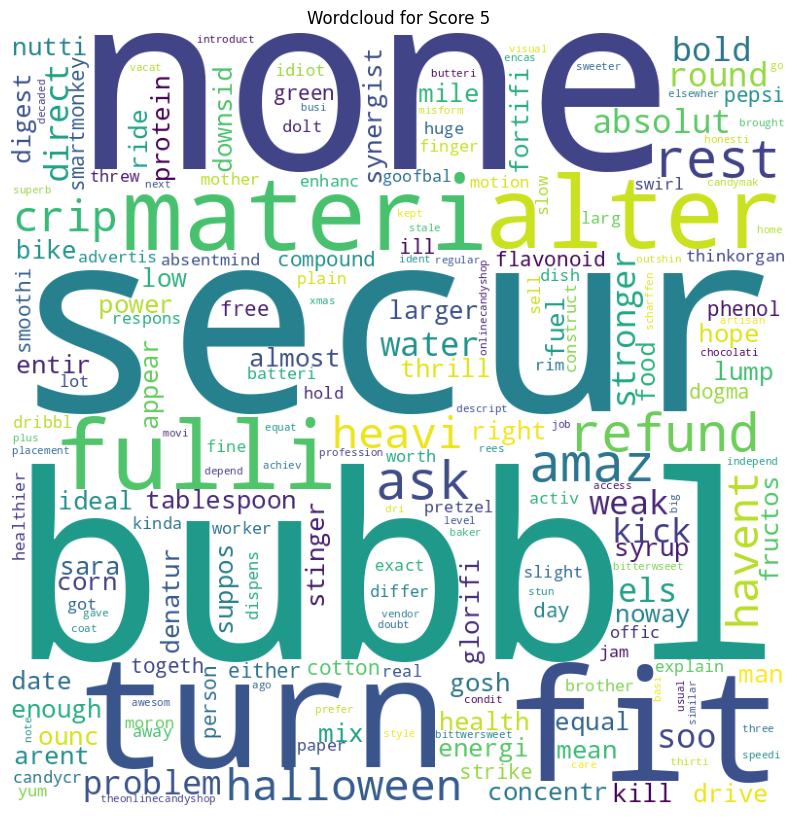

In [ ]:
#candy

from wordcloud import WordCloud
import matplotlib.pyplot as plt
import pandas as pd


# Filter the reviews related to candy
candy_df = df1[df1['CleanedText'].str.contains('candy', case=False)]

# Function to remove common words from a sentence
def removeCommonWords(sent):
    # Store the words present in the sentence
    sentence = list(sent.split())
    # Calculate frequency of words using Counter() function
    frequency = Counter(sentence)
    # Remove common words from sentence
    sentence = [word for word in sentence if frequency[word] == 1]
    # Return the remaining words in the sentence as a string
    return ' '.join(sentence)

# Loop through the dataframe df_pet for each score
for score in range(1, 6):
    # Filter rows with the current score
    df_score = candy_df[candy_df['Score'] == score]
    # Join all sentences in the 'CleanedText' column into one string
    text = ' '.join(df_score['CleanedText'].tolist())
    # Remove common words from the string
    text = removeCommonWords(text)
    # Generate wordcloud for the current score
    wordcloud = WordCloud(width=800, height=800, background_color='white', min_font_size=10).generate(text)
    # Plot the wordcloud with a title
    plt.figure(figsize=(8, 8), facecolor=None)
    plt.imshow(wordcloud)
    plt.axis('off')
    plt.title(f"Wordcloud for Score {score}")
    plt.tight_layout(pad=0)
    plt.show()

In [ ]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...


True

In [ ]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer


# Initialize the SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()


# Define the lambda function to map the scores to sentiment
def map_sentiment(score, text, helpfulness_numerator, helpfulness_denominator):
    if score > 3 and helpfulness_numerator > 0 and helpfulness_denominator == helpfulness_numerator:
        return 'positive'
    elif score < 3 and helpfulness_numerator == 0 and helpfulness_denominator != helpfulness_numerator:
        return 'negative'
    elif score > 3 and helpfulness_numerator == 0 and helpfulness_denominator == helpfulness_numerator:
        return 'positive'
    elif score < 3 and helpfulness_numerator == 0 and helpfulness_denominator == helpfulness_numerator:
        return 'negative'
    elif score == 3:
        sentiment_scores = sia.polarity_scores(text)
        if helpfulness_numerator > 0 and helpfulness_denominator == helpfulness_numerator and sentiment_scores['compound'] >= 0.7:
            return 'positive'
        elif helpfulness_numerator == 0 and helpfulness_denominator != helpfulness_numerator and sentiment_scores['compound'] < 0.7:
            return 'negative'
        elif helpfulness_numerator == 0 and helpfulness_denominator == helpfulness_numerator and sentiment_scores['compound'] >= 0.7:
            return 'positive'
        elif score < 3 and helpfulness_numerator == 0 and helpfulness_denominator == helpfulness_numerator and sentiment_scores['compound'] < 0.7:
            return 'negative'
        else:
            return 'positive' # default to positive sentiment for score of 3 if none of the above conditions are met
    else:
        return 'negative' # default to neutral sentiment for scores less than 3


In [ ]:
# Apply the map_sentiment function to the Score, CleanedText, HelpfulnessNumerator, and HelpfulnessDenominator columns and store the result in a new column called 'Sentiment'
sentiments = []
for score, text, helpfulness_numerator, helpfulness_denominator in tqdm(zip(df1['Score'], df1['Text'], df1['HelpfulnessNumerator'], df1['HelpfulnessDenominator'])):
    sentiment = map_sentiment(score, text, helpfulness_numerator, helpfulness_denominator)
    sentiments.append(sentiment)


df1['Sentiment'] = sentiments
df1.head()


393579it [00:37, 10493.86it/s]


,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,ProductURL,CleanedText,Sentiment
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,2011,Good Quality Dog Food,I have bought several of the Vitality canned d...,https://www.amazon.com/dp/B001E4KFG0,bought sever vital can dog food product found ...,positive
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,2012,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,https://www.amazon.com/dp/B00813GRG4,product arriv label jumbo salt peanut actual s...,negative
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,2008,"""Delight"" says it all",This is a confection that has been around a fe...,https://www.amazon.com/dp/B000LQOCH0,confect around pillowi citrus gelatin nut case...,positive
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,2011,Cough Medicine,If you are looking for the secret ingredient i...,https://www.amazon.com/dp/B000UA0QIQ,look secret ingredi robitussin believ found go...,negative
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,2012,Great taffy,Great taffy at a great price. There was a wid...,https://www.amazon.com/dp/B006K2ZZ7K,great taffi great wide assort yummi deliveri t...,positive


In [ ]:
# Create new columns 'GoodStore' and 'BadStore'
df1['GoodStore'] = df1['Sentiment'].apply(lambda x: 1 if x == 'positive' else 0)
df1['BadStore'] = df1['Sentiment'].apply(lambda x: 1 if x == 'negative' else 0)
df1.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text,ProductURL,CleanedText,Sentiment,GoodStore,BadStore
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,2011,Good Quality Dog Food,I have bought several of the Vitality canned d...,https://www.amazon.com/dp/B001E4KFG0,bought sever vital can dog food product found ...,positive,1,0
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,2012,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,https://www.amazon.com/dp/B00813GRG4,product arriv label jumbo salt peanut actual s...,negative,0,1
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,2008,"""Delight"" says it all",This is a confection that has been around a fe...,https://www.amazon.com/dp/B000LQOCH0,confect around pillowi citrus gelatin nut case...,positive,1,0
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,2011,Cough Medicine,If you are looking for the secret ingredient i...,https://www.amazon.com/dp/B000UA0QIQ,look secret ingredi robitussin believ found go...,negative,0,1
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,2012,Great taffy,Great taffy at a great price. There was a wid...,https://www.amazon.com/dp/B006K2ZZ7K,great taffi great wide assort yummi deliveri t...,positive,1,0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
# Specify the .csv file path
csv_file_path = '/content/drive/MyDrive/Study/NTUST/Big Data Analytic/Me/MidTerm/Sentiment.csv'  # Update with your actual file path
import pandas as pd
# Read the .csv file into a DataFrame
df2 = pd.read_csv(csv_file_path)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


IMPORT DATASET FROM MONGODB

In [ ]:
score_sentiment_df2 = df2[['ProductId', 'Score','HelpfulnessNumerator','HelpfulnessDenominator','Sentiment']]
score_sentiment_df2.head()

,ProductId,Score,HelpfulnessNumerator,HelpfulnessDenominator,Sentiment
0,B001E4KFG0,5,1,1,positive
1,B00813GRG4,1,0,0,negative
2,B000LQOCH0,4,1,1,positive
3,B000UA0QIQ,2,3,3,negative
4,B006K2ZZ7K,5,0,0,positive


In [ ]:
# create a dictionary to store the sentiment counts for each product
sentiment_dict = {}
for product in score_sentiment_df2['ProductId'].unique():
    sentiment_dict[product] = {
        'negative': 0,
        'positive': 0
    }

# iterate over each row in the score_sentiment_df and increment the corresponding sentiment count
for index, row in score_sentiment_df2.iterrows():
    sentiment_dict[row['ProductId']][row['Sentiment']] += 1

# create a new dataframe from the sentiment_dict
sentiment_counts_df2 = pd.DataFrame.from_dict(sentiment_dict, orient='index')

# add the ProductId column
sentiment_counts_df2.index.name = 'ProductId'

# display the first 10 rows
sentiment_counts_df2.head(10)

,negative,positive
ProductId,,
B001E4KFG0,0,1
B00813GRG4,1,0
B000LQOCH0,0,1
B000UA0QIQ,1,0
B006K2ZZ7K,0,4
B000E7L2R4,0,1
B00171APVA,0,1
B0001PB9FE,0,1
B0009XLVG0,1,1


In [ ]:
sentiment_counts_df2 = sentiment_counts_df2.sort_values(['positive', 'negative'], ascending=[False, True])
sentiment_counts_df2

,negative,positive
ProductId,,
B002QWP89S,57,573
B003B3OOPA,97,525
B000NMJWZO,26,516
B001EO5Q64,78,487
B0013NUGDE,92,465
...,...,...
B000KS3L4E,13,0
B0032GREWQ,16,0
B000G1EO0A,20,0


In [ ]:
good_store = sentiment_counts_df2[sentiment_counts_df2['positive']>sentiment_counts_df2['negative']]
good_store.sort_values(['positive'], ascending=False)
print(good_store.head(5))
print(good_store.tail(5))

            negative  positive
ProductId                     
B002QWP89S        57       573
B003B3OOPA        97       525
B000NMJWZO        26       516
B001EO5Q64        78       487
B0013NUGDE        92       465
            negative  positive
ProductId                     
B001BDB2OS         0         1
B003L7Z2KW         0         1
B004VRJV8K         0         1
B000FTE4S0         0         1
B0041CBI8Q         0         1


In [ ]:
bad_store = sentiment_counts_df2[sentiment_counts_df2['negative']>sentiment_counts_df2['positive']]
bad_store.sort_values(['negative'], ascending=False)
print(bad_store.head())
print(bad_store.tail())

Product Rank Based on Total Purchase

In [ ]:
import warnings
warnings.filterwarnings("ignore")

good_store['Total Purchase'] = good_store['positive'] + good_store['negative']
good_store.head(10)

PIE CHART FOR GOOD STORE AND BAD STORE

In [ ]:
import matplotlib.pyplot as plt
from tabulate import tabulate

# Calculate the total number of good and bad stores
total_good_stores = len(good_store)
total_bad_stores = len(bad_store)
total_stores = total_good_stores + total_bad_stores
# Create the table
table = [['Total Stores', total_stores], ['Total Good Stores', total_good_stores], ['Total Bad Stores', total_bad_stores]]
# Print the table
print(tabulate(table, headers=['Store Type', 'Total Count'], tablefmt='orgtbl'))


# Create a pie chart
sizes = [total_good_stores, total_bad_stores]
colors = ['#000080', '#0077be']
plt.pie(sizes, colors=colors, autopct='%1.1f%%', textprops={'color': 'white'})
plt.axis('equal')
plt.title('Distribution of Good and bad Stores')
plt.show()


In [ ]:
import matplotlib.pyplot as plt

# Assuming 'good_store' is your DataFrame
# Sort the DataFrame by 'Total Purchase' in descending order
good_store = good_store.sort_values('Total Purchase', ascending=False)

# Create a bar chart
plt.figure(figsize=(10, 6)) # Set the figure size
plt.bar(good_store.index, good_store['Total Purchase']) # Set the x-axis and y-axis values
plt.xlabel('Store') # Set the x-axis label
plt.ylabel('Total Purchase') # Set the y-axis label
plt.title('Distribution of Total Purchase by Store') # Set the title of the chart
plt.xticks(rotation=90) # Rotate x-axis labels for better visibility
plt.show() # Show the bar chart


GOOD STORE WITH LOWEST PURCHASE

In [ ]:
good_store_sorted = good_store.sort_values(by='Total Purchase', ascending=True)
good_store_sorted.head()

In [ ]:
# Define the categories and corresponding keywords
categories = {
    'Health & Beauty': 'medicine|diet|fitness|lips|fragrance',
    'Food & Beverage': 'tasti|tea|instant|cookie|coffee',
    'Electronics': 'cellphones|smart|digital|tech|portable',
    'Pet Food': 'dog|cat|kitten|animal|rabbit',
    'Kitchen': 'kitchen|dining|blender|colander|tablecloth'
}

# Iterate over the categories and keywords to process the data and create dataframes
for category, keywords in categories.items():
    # Filter the data for the category
    df_category = df2[df2['Text'].str.contains(keywords, case=False)]

    # Show the number of rows
    print(f"Number of rows for {category}: {df_category.shape[0]}")

    # Create a dictionary to store the sentiment counts for each product
    sentiment_dict = {}
    for product in df_category['ProductId'].unique():
        sentiment_dict[product] = {
            'negative': 0,
            'positive': 0
        }

    # Iterate over each row in the data and increment the corresponding sentiment count
    for index, row in df_category.iterrows():
        sentiment_dict[row['ProductId']][row['Sentiment']] += 1

    # Create a new dataframe from the sentiment_dict
    df_category = pd.DataFrame.from_dict(sentiment_dict, orient='index')

    # Add the ProductId column
    df_category.index.name = 'ProductId'

    # Add a new column for the total number of purchases
    df_category['Total Purchase'] = df_category['negative'] + df_category['positive']

    # Sort the data by the lowest score in the positive column
    df_category = df_category[df_category['positive'] > df_category['negative']].sort_values(by='positive').head()

    # Display the data
    print(df_category)


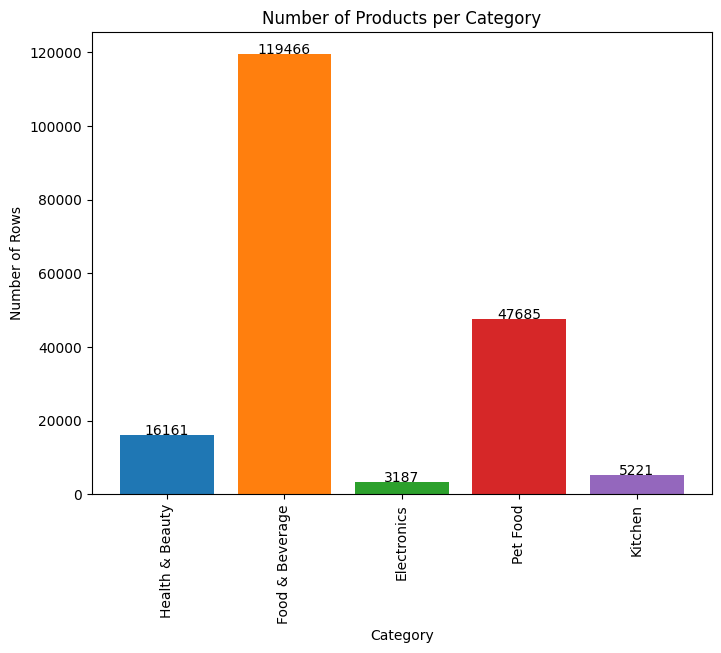

In [ ]:


# Define the categories and corresponding keywords
categories = {
    'Health & Beauty': 'medicine|diet|fitness|lips|fragrance',
    'Food & Beverage': 'tasti|tea|instant|cookie|coffee',
    'Electronics': 'cellphones|smart|digital|tech|portable',
    'Pet Food': 'dog|cat|kitten|animal|rabbit',
    'Kitchen': 'kitchen|dining|blender|colander|tablecloth'
}

# Create lists to store the number of rows and category names
num_rows = []
cat_names = []

# Create a figure object and set its size
fig = plt.figure(figsize=(8, 6))

# Iterate over the categories and keywords to process the data and create dataframes
for category, keywords in categories.items():
    # Filter the data for the category
    df_category = df2[df2['Text'].str.contains(keywords, case=False)]

    # Get the number of rows
    num = df_category.shape[0]

    # Add the number of rows and category name to the lists
    num_rows.append(num)
    cat_names.append(category)

    # Create a bar for the category with the number of rows as the label
    plt.bar(category, num, label=num)

# Set the chart title and axis labels
plt.title('Number of Products per Category')
plt.xlabel('Category')
plt.ylabel('Number of Rows')

# Show the number of rows above each bar
for i in range(len(num_rows)):
    plt.text(i, num_rows[i] + 50, num_rows[i], ha='center', fontsize=10)

# Rotate x-axis labels 90 degrees
plt.xticks(rotation=90)

# Save the plot as a jpg file in your Google Drive
plt.savefig('/content/drive/My Drive/num_rows_per_category.jpg')

# Show the plot
plt.show()


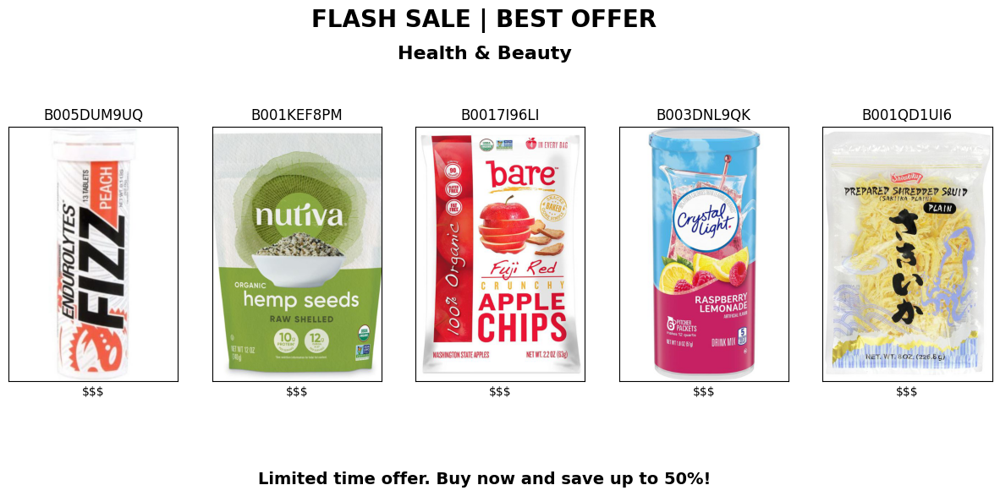

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# Define image file paths and titles
image_files = ['/content/drive/MyDrive/Bigdata/1.jpg',
               '/content/drive/MyDrive/Bigdata/2.jpg',
               '/content/drive/MyDrive/Bigdata/3.jpg',
               '/content/drive/MyDrive/Bigdata/4.jpg',
               '/content/drive/MyDrive/Bigdata/5.jpg']
titles = ['B005DUM9UQ', 'B001KEF8PM', 'B0017I96LI', 'B003DNL9QK', 'B001QD1UI6']


# Create figure and axes objects
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(15,6))

# Add title and text to figure
fig.suptitle('FLASH SALE | BEST OFFER', fontsize=20, fontweight='bold')
fig.text(0.5, 0.05, 'Limited time offer. Buy now and save up to 50%!',
         ha='center', va='center', fontsize=14, fontweight='bold')
fig.text(0.5, 0.88, 'Health & Beauty', fontsize=16, fontweight='bold', ha='center')

# Load images and plot them on axes
for i, image_file in enumerate(image_files):
    img = Image.open(image_file)
    axs[i].imshow(img)
    axs[i].set_title(titles[i])
    axs[i].set_xlabel('$$$')
    axs[i].set_xticks([])
    axs[i].set_yticks([])
    axs[i].set_ylabel('')

# Display plot
plt.show()
fig.savefig('/content/drive/MyDrive/Bigdata/flash_sale1.png')

FIND HIGHEST TOTAL PURCHASE IN BAD STORE AND PICK 5 PRODUCT AT THE HIGHEST PURCHASE

In [ ]:
import warnings
warnings.filterwarnings("ignore")

bad_store['Total Purchase'] = bad_store['positive'] + bad_store['negative']
bad_store.head()

,negative,positive,Total Purchase
ProductId,,,
B007I7Z3Z0,232,128,360
B0045XE32E,165,117,282
B007RTR9DS,94,92,186
B004Q3LBTG,103,87,190
B000FI4O90,103,87,190


WORD CLOUD SCORE = 1 && 2 OF EACH PRODUCT

ITERATE BAD PRODUCT

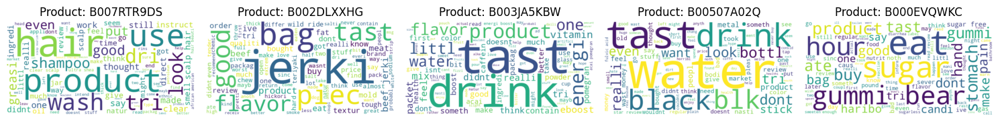

In [ ]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud
import pandas as pd

# List of product IDs to generate word clouds for
product_ids = ["B007RTR9DS", "B002DLXXHG", "B003JA5KBW", "B00507A02Q", "B000EVQWKC"]

# Scores to filter the data on
scores = [1, 2]

# Define the subplot layout
num_rows = 1
num_cols = 5

# Create a figure and subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 10))

# Flatten the axes array for easy indexing
axes = axes.flatten()

# Iterate over each product ID and generate word cloud
for i, product_id in enumerate(product_ids):
    # Filter the data based on product and score
    filtered_data = df2[(df2["ProductId"] == product_id) & (df2["Score"].isin(scores))]

    # Concatenate the filtered "CleanedText" column into a single string
    text = " ".join(filtered_data["CleanedText"].tolist())

    # Create a WordCloud object with desired settings
    wordcloud = WordCloud(width=800, height=400, max_words=100, background_color="white").generate(text)

    # Plot the word cloud on the corresponding subplot
    axes[i].imshow(wordcloud, interpolation="bilinear")
    axes[i].axis("off")
    axes[i].set_title(f"Product: {product_id}")

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()


WORDCLOUD -- ASPECT ANALYSIS

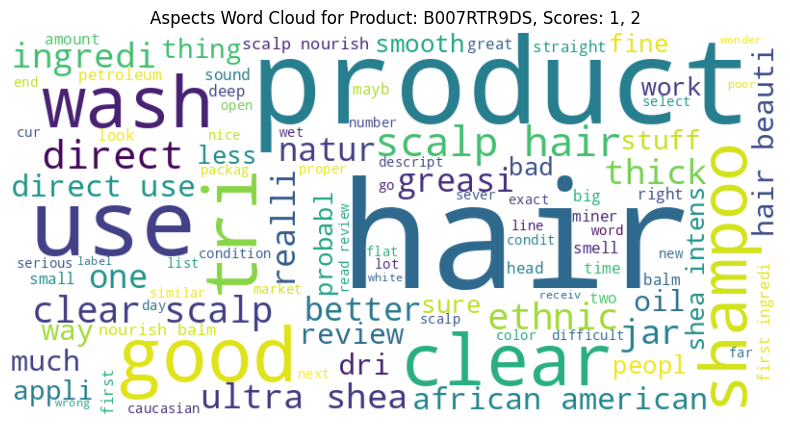

In [ ]:
#Product 1 Aspect Analysis
import spacy
nlp = spacy.load('en_core_web_sm')

# Define product and scores
product = "B007RTR9DS"
scores = [1, 2]

# Filter the data based on product and score
filtered_data = df[(df["ProductId"] == product) & (df["Score"].isin(scores))]

# Define a list to store identified aspects
aspects = []

# Iterate through each review
for review in filtered_data['CleanedText']:
    # Parse the review using the dependency parser
    doc = nlp(review)

    # Extract noun chunks (potential aspects)
    noun_chunks = list(doc.noun_chunks)

    # Iterate through each noun chunk and check if it has a modifier that is an adjective
    for chunk in noun_chunks:
        for token in chunk:
            if token.pos_ == 'ADJ':
                aspects.append(chunk.text)
                break

# Remove duplicates and convert to a string
aspects_string = ' '.join(list(set(aspects)))

# Create a WordCloud object with desired settings
wordcloud = WordCloud(width=800, height=400, max_words=100, background_color="white").generate(aspects_string)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title(f"Aspects Word Cloud for Product: {product}, Scores: {', '.join(map(str, scores))}")
plt.show()


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


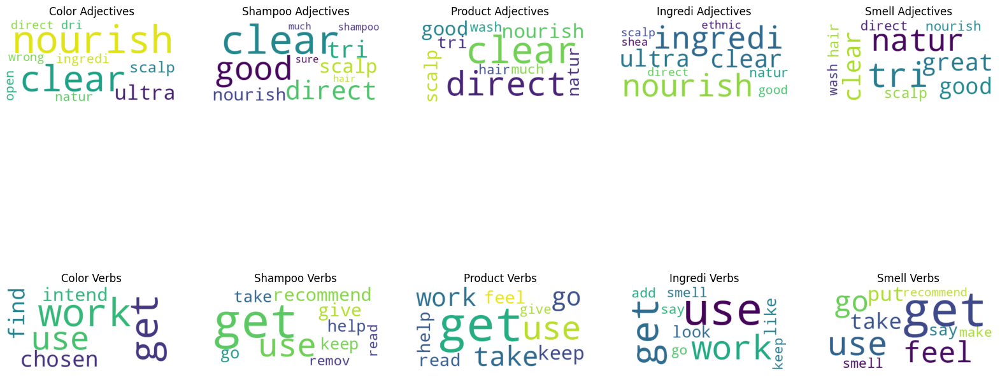

In [ ]:
#Product 1 for Adjective & Verb Analysis
from collections import defaultdict
from nltk.corpus import stopwords
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
import nltk
import nltk
nltk.download('averaged_perceptron_tagger')

# Define words to exclude from analysis
exclude_words = {None}

# Define aspects to analyze
aspects = ['color', 'shampoo', 'product', 'ingredi', 'smell']

# Filter the data based on product and score
product = "B007RTR9DS"
scores = [1, 2]
filtered_data = df[(df["ProductId"] == product) & (df["Score"].isin(scores))]

# Initialize a dictionary to store the adjectives and verbs for each aspect
aspect_adjectives = defaultdict(list)
aspect_verbs = defaultdict(list)

#Stopwords
stop_words = set(stopwords.words('english'))
exclude_words = {None}
stop_words = stop_words - exclude_words

# Iterate over each review and extract adjectives and verbs for each aspect
for review in filtered_data['CleanedText']:
    for aspect in aspects:
        if aspect in review.lower():
            words = review.lower().split()
            filtered_words = [word for word in words if (word not in stop_words and word not in exclude_words)]
            for word, pos in nltk.pos_tag(filtered_words):
                if pos == 'JJ':
                    aspect_adjectives[aspect].append(word)
                elif pos == 'VB':
                    aspect_verbs[aspect].append(word)

# Get the top 10 adjectives for each aspect
top_adjectives = {}
for aspect in aspect_adjectives:
    adjective_freq = Counter(aspect_adjectives[aspect])
    top_adjectives[aspect] = adjective_freq.most_common(10)

# Get the top 10 verbs for each aspect
top_verbs = {}
for aspect in aspect_verbs:
    verb_freq = Counter(aspect_verbs[aspect])
    top_verbs[aspect] = verb_freq.most_common(10)

# Create a word cloud for the top adjectives and verbs mentioned for each aspect
fig, axs = plt.subplots(2, len(aspects), figsize=(20, 10))
for i, aspect in enumerate(aspects):
    if aspect in top_adjectives and top_adjectives[aspect]:
        wordcloud = WordCloud(width=400, height=200, max_words=50, background_color="white").generate_from_frequencies(dict(top_adjectives[aspect]))
        axs[0, i].imshow(wordcloud, interpolation="bilinear")
    axs[0, i].axis("off")
    axs[0, i].set_title(f"{aspect.capitalize()} Adjectives")

    if aspect in top_verbs and top_verbs[aspect]:
        wordcloud = WordCloud(width=400, height=200, max_words=50, background_color="white").generate_from_frequencies(dict(top_verbs[aspect]))
        axs[1, i].imshow(wordcloud, interpolation="bilinear")
    axs[1, i].axis("off")
    axs[1, i].set_title(f"{aspect.capitalize()} Verbs")
plt.show()


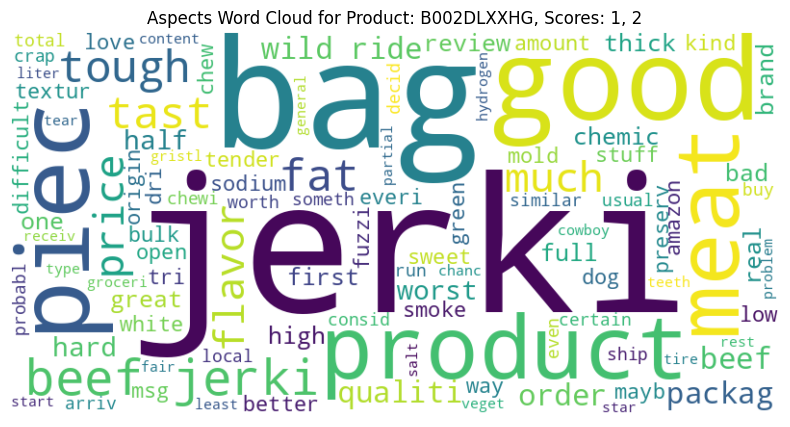

In [ ]:
#Product 2 for Aspect Analysis
import spacy
nlp = spacy.load('en_core_web_sm')

# Define product and scores
product = "B002DLXXHG"
scores = [1, 2]

# Filter the data based on product and score
filtered_data = df[(df["ProductId"] == product) & (df["Score"].isin(scores))]

# Define a list to store identified aspects
aspects = []

# Iterate through each review
for review in filtered_data['CleanedText']:
    # Parse the review using the dependency parser
    doc = nlp(review)

    # Extract noun chunks (potential aspects)
    noun_chunks = list(doc.noun_chunks)

    # Iterate through each noun chunk and check if it has a modifier that is an adjective
    for chunk in noun_chunks:
        for token in chunk:
            if token.pos_ == 'ADJ':
                aspects.append(chunk.text)
                break

# Remove duplicates and convert to a string
aspects_string = ' '.join(list(set(aspects)))

# Create a WordCloud object with desired settings
wordcloud = WordCloud(width=800, height=400, max_words=100, background_color="white").generate(aspects_string)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title(f"Aspects Word Cloud for Product: {product}, Scores: {', '.join(map(str, scores))}")
plt.show()


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


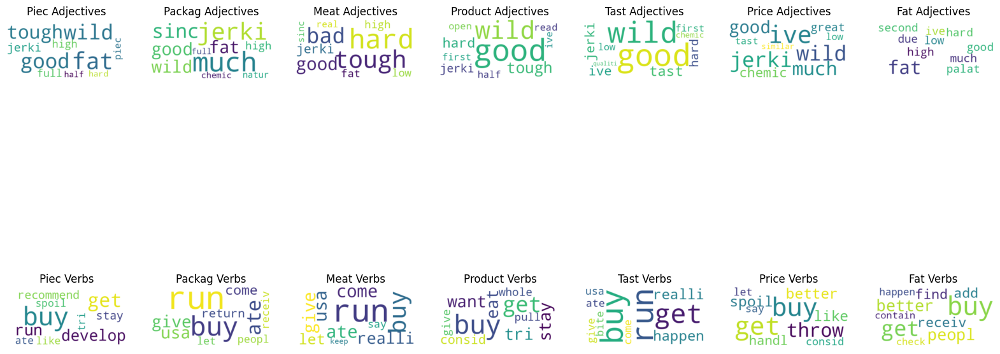

In [ ]:
#Product 2 for Adjective & Verb Analysis
from collections import defaultdict
from nltk.corpus import stopwords
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
import nltk
import nltk
nltk.download('averaged_perceptron_tagger')

# Define words to exclude from analysis
exclude_words = {None}

# Define aspects to analyze
aspects = ['piec', 'packag', 'meat', 'product','tast', 'price', 'fat']

# Filter the data based on product and score
product = "B002DLXXHG"
scores = [1, 2]
filtered_data = df[(df["ProductId"] == product) & (df["Score"].isin(scores))]

# Initialize a dictionary to store the adjectives and verbs for each aspect
aspect_adjectives = defaultdict(list)
aspect_verbs = defaultdict(list)

#Stopwords
stop_words = set(stopwords.words('english'))
exclude_words = {None}
stop_words = stop_words - exclude_words

# Iterate over each review and extract adjectives and verbs for each aspect
for review in filtered_data['CleanedText']:
    for aspect in aspects:
        if aspect in review.lower():
            words = review.lower().split()
            filtered_words = [word for word in words if (word not in stop_words and word not in exclude_words)]
            for word, pos in nltk.pos_tag(filtered_words):
                if pos == 'JJ':
                    aspect_adjectives[aspect].append(word)
                elif pos == 'VB':
                    aspect_verbs[aspect].append(word)

# Get the top 10 adjectives for each aspect
top_adjectives = {}
for aspect in aspect_adjectives:
    adjective_freq = Counter(aspect_adjectives[aspect])
    top_adjectives[aspect] = adjective_freq.most_common(10)

# Get the top 10 verbs for each aspect
top_verbs = {}
for aspect in aspect_verbs:
    verb_freq = Counter(aspect_verbs[aspect])
    top_verbs[aspect] = verb_freq.most_common(10)

# Create a word cloud for the top adjectives and verbs mentioned for each aspect
fig, axs = plt.subplots(2, len(aspects), figsize=(20, 10))
for i, aspect in enumerate(aspects):
    if aspect in top_adjectives and top_adjectives[aspect]:
        wordcloud = WordCloud(width=400, height=200, max_words=50, background_color="white").generate_from_frequencies(dict(top_adjectives[aspect]))
        axs[0, i].imshow(wordcloud, interpolation="bilinear")
    axs[0, i].axis("off")
    axs[0, i].set_title(f"{aspect.capitalize()} Adjectives")

    if aspect in top_verbs and top_verbs[aspect]:
        wordcloud = WordCloud(width=400, height=200, max_words=50, background_color="white").generate_from_frequencies(dict(top_verbs[aspect]))
        axs[1, i].imshow(wordcloud, interpolation="bilinear")
    axs[1, i].axis("off")
    axs[1, i].set_title(f"{aspect.capitalize()} Verbs")
plt.show()


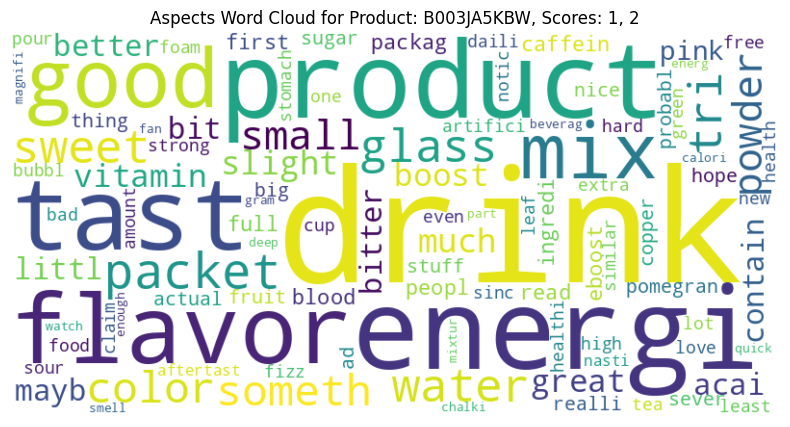

In [ ]:
#Product 3 for Aspect Analysis
import spacy
nlp = spacy.load('en_core_web_sm')

# Define product and scores
product = "B003JA5KBW"
scores = [1, 2]

# Filter the data based on product and score
filtered_data = df[(df["ProductId"] == product) & (df["Score"].isin(scores))]

# Define a list to store identified aspects
aspects = []

# Iterate through each review
for review in filtered_data['CleanedText']:
    # Parse the review using the dependency parser
    doc = nlp(review)

    # Extract noun chunks (potential aspects)
    noun_chunks = list(doc.noun_chunks)

    # Iterate through each noun chunk and check if it has a modifier that is an adjective
    for chunk in noun_chunks:
        for token in chunk:
            if token.pos_ == 'ADJ':
                aspects.append(chunk.text)
                break

# Remove duplicates and convert to a string
aspects_string = ' '.join(list(set(aspects)))

# Create a WordCloud object with desired settings
wordcloud = WordCloud(width=800, height=400, max_words=100, background_color="white").generate(aspects_string)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title(f"Aspects Word Cloud for Product: {product}, Scores: {', '.join(map(str, scores))}")
plt.show()


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


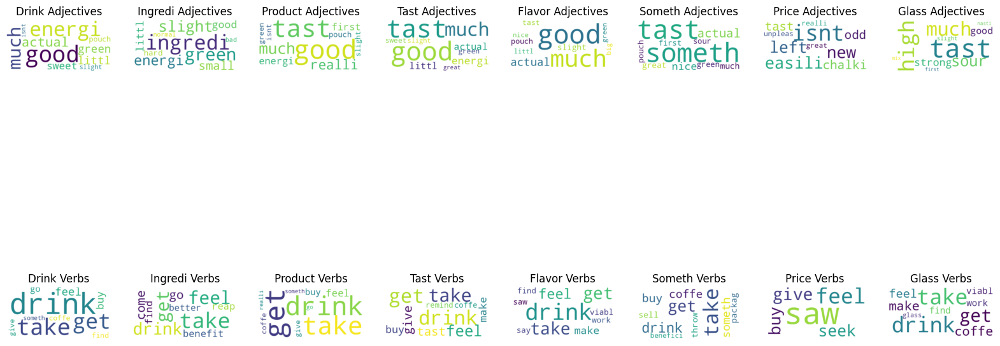

In [ ]:
#Product 3 for Adjective & Verb Analysis
from collections import defaultdict
from nltk.corpus import stopwords
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
import nltk
import nltk
nltk.download('averaged_perceptron_tagger')

# Define words to exclude from analysis
exclude_words = {None}

# Define aspects to analyze
aspects = ['drink', 'ingredi', 'product','tast','flavor', 'someth', 'price', 'glass']

# Filter the data based on product and score
product = "B003JA5KBW"
scores = [1, 2]
filtered_data = df[(df["ProductId"] == product) & (df["Score"].isin(scores))]

# Initialize a dictionary to store the adjectives and verbs for each aspect
aspect_adjectives = defaultdict(list)
aspect_verbs = defaultdict(list)

#Stopwords
stop_words = set(stopwords.words('english'))
exclude_words = {None}
stop_words = stop_words - exclude_words

# Iterate over each review and extract adjectives and verbs for each aspect
for review in filtered_data['CleanedText']:
    for aspect in aspects:
        if aspect in review.lower():
            words = review.lower().split()
            filtered_words = [word for word in words if (word not in stop_words and word not in exclude_words)]
            for word, pos in nltk.pos_tag(filtered_words):
                if pos == 'JJ':
                    aspect_adjectives[aspect].append(word)
                elif pos == 'VB':
                    aspect_verbs[aspect].append(word)

# Get the top 10 adjectives for each aspect
top_adjectives = {}
for aspect in aspect_adjectives:
    adjective_freq = Counter(aspect_adjectives[aspect])
    top_adjectives[aspect] = adjective_freq.most_common(10)

# Get the top 10 verbs for each aspect
top_verbs = {}
for aspect in aspect_verbs:
    verb_freq = Counter(aspect_verbs[aspect])
    top_verbs[aspect] = verb_freq.most_common(10)

# Create a word cloud for the top adjectives and verbs mentioned for each aspect
fig, axs = plt.subplots(2, len(aspects), figsize=(20, 10))
for i, aspect in enumerate(aspects):
    if aspect in top_adjectives and top_adjectives[aspect]:
        wordcloud = WordCloud(width=400, height=200, max_words=50, background_color="white").generate_from_frequencies(dict(top_adjectives[aspect]))
        axs[0, i].imshow(wordcloud, interpolation="bilinear")
    axs[0, i].axis("off")
    axs[0, i].set_title(f"{aspect.capitalize()} Adjectives")

    if aspect in top_verbs and top_verbs[aspect]:
        wordcloud = WordCloud(width=400, height=200, max_words=50, background_color="white").generate_from_frequencies(dict(top_verbs[aspect]))
        axs[1, i].imshow(wordcloud, interpolation="bilinear")
    axs[1, i].axis("off")
    axs[1, i].set_title(f"{aspect.capitalize()} Verbs")
plt.show()


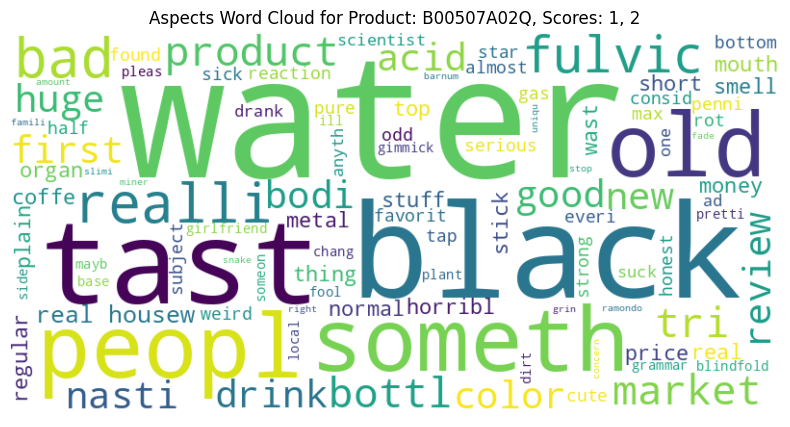

In [ ]:
#Product 4 for Aspect Analysis
import spacy
nlp = spacy.load('en_core_web_sm')

# Define product and scores
product = "B00507A02Q"
scores = [1, 2]

# Filter the data based on product and score
filtered_data = df[(df["ProductId"] == product) & (df["Score"].isin(scores))]

# Define a list to store identified aspects
aspects = []

# Iterate through each review
for review in filtered_data['CleanedText']:
    # Parse the review using the dependency parser
    doc = nlp(review)

    # Extract noun chunks (potential aspects)
    noun_chunks = list(doc.noun_chunks)

    # Iterate through each noun chunk and check if it has a modifier that is an adjective
    for chunk in noun_chunks:
        for token in chunk:
            if token.pos_ == 'ADJ':
                aspects.append(chunk.text)
                break

# Remove duplicates and convert to a string
aspects_string = ' '.join(list(set(aspects)))

# Create a WordCloud object with desired settings
wordcloud = WordCloud(width=800, height=400, max_words=100, background_color="white").generate(aspects_string)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title(f"Aspects Word Cloud for Product: {product}, Scores: {', '.join(map(str, scores))}")
plt.show()


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


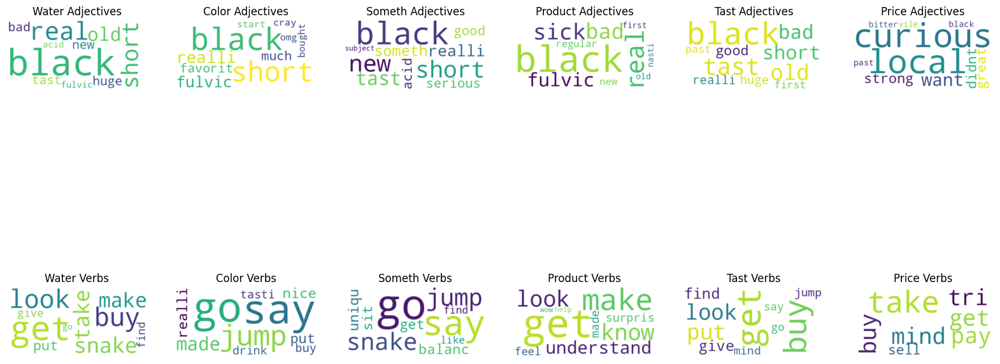

In [ ]:
#Product 4 for Adjective & Verb Analysis
from collections import defaultdict
from nltk.corpus import stopwords
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
import nltk
import nltk
nltk.download('averaged_perceptron_tagger')

# Define words to exclude from analysis
exclude_words = {None}

# Define aspects to analyze
aspects = ['water', 'color', 'someth', 'product','tast', 'price']

# Filter the data based on product and score
product = "B00507A02Q"
scores = [1, 2]
filtered_data = df[(df["ProductId"] == product) & (df["Score"].isin(scores))]

# Initialize a dictionary to store the adjectives and verbs for each aspect
aspect_adjectives = defaultdict(list)
aspect_verbs = defaultdict(list)

#Stopwords
stop_words = set(stopwords.words('english'))
exclude_words = {None}
stop_words = stop_words - exclude_words

# Iterate over each review and extract adjectives and verbs for each aspect
for review in filtered_data['CleanedText']:
    for aspect in aspects:
        if aspect in review.lower():
            words = review.lower().split()
            filtered_words = [word for word in words if (word not in stop_words and word not in exclude_words)]
            for word, pos in nltk.pos_tag(filtered_words):
                if pos == 'JJ':
                    aspect_adjectives[aspect].append(word)
                elif pos == 'VB':
                    aspect_verbs[aspect].append(word)

# Get the top 10 adjectives for each aspect
top_adjectives = {}
for aspect in aspect_adjectives:
    adjective_freq = Counter(aspect_adjectives[aspect])
    top_adjectives[aspect] = adjective_freq.most_common(10)

# Get the top 10 verbs for each aspect
top_verbs = {}
for aspect in aspect_verbs:
    verb_freq = Counter(aspect_verbs[aspect])
    top_verbs[aspect] = verb_freq.most_common(10)

# Create a word cloud for the top adjectives and verbs mentioned for each aspect
fig, axs = plt.subplots(2, len(aspects), figsize=(20, 10))
for i, aspect in enumerate(aspects):
    if aspect in top_adjectives and top_adjectives[aspect]:
        wordcloud = WordCloud(width=400, height=200, max_words=50, background_color="white").generate_from_frequencies(dict(top_adjectives[aspect]))
        axs[0, i].imshow(wordcloud, interpolation="bilinear")
    axs[0, i].axis("off")
    axs[0, i].set_title(f"{aspect.capitalize()} Adjectives")

    if aspect in top_verbs and top_verbs[aspect]:
        wordcloud = WordCloud(width=400, height=200, max_words=50, background_color="white").generate_from_frequencies(dict(top_verbs[aspect]))
        axs[1, i].imshow(wordcloud, interpolation="bilinear")
    axs[1, i].axis("off")
    axs[1, i].set_title(f"{aspect.capitalize()} Verbs")
plt.show()


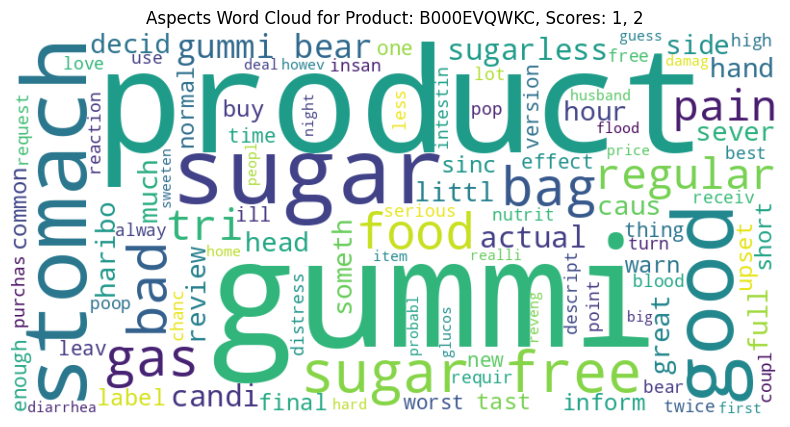

In [ ]:
#Product 5 for Aspect Analysis
import spacy
nlp = spacy.load('en_core_web_sm')

# Define product and scores
product = "B000EVQWKC"
scores = [1, 2]

# Filter the data based on product and score
filtered_data = df[(df["ProductId"] == product) & (df["Score"].isin(scores))]

# Define a list to store identified aspects
aspects = []

# Iterate through each review
for review in filtered_data['CleanedText']:
    # Parse the review using the dependency parser
    doc = nlp(review)

    # Extract noun chunks (potential aspects)
    noun_chunks = list(doc.noun_chunks)

    # Iterate through each noun chunk and check if it has a modifier that is an adjective
    for chunk in noun_chunks:
        for token in chunk:
            if token.pos_ == 'ADJ':
                aspects.append(chunk.text)
                break

# Remove duplicates and convert to a string
aspects_string = ' '.join(list(set(aspects)))

# Create a WordCloud object with desired settings
wordcloud = WordCloud(width=800, height=400, max_words=100, background_color="white").generate(aspects_string)

# Plot the word cloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title(f"Aspects Word Cloud for Product: {product}, Scores: {', '.join(map(str, scores))}")
plt.show()


[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


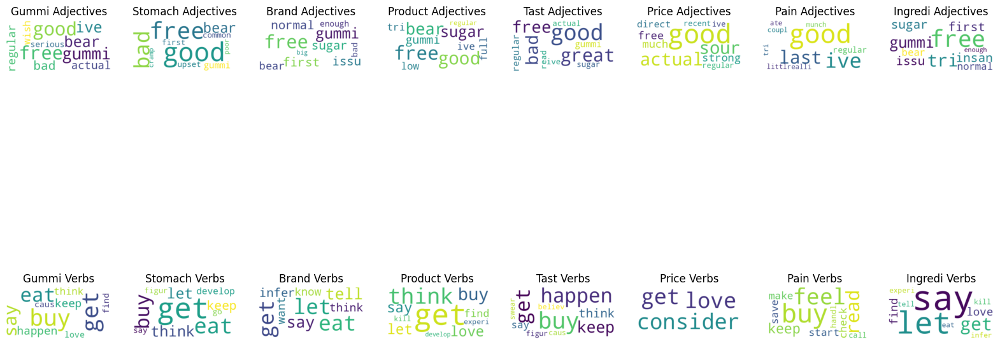

In [ ]:
#Product 5 for Adjective & Verb Analysis
from collections import defaultdict
from nltk.corpus import stopwords
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import defaultdict, Counter
import nltk
import nltk
nltk.download('averaged_perceptron_tagger')

# Define words to exclude from analysis
exclude_words = {None}

# Define aspects to analyze
aspects = ['gummi', 'stomach', 'brand', 'product','tast','price', 'pain', 'ingredi']

# Filter the data based on product and score
product = "B000EVQWKC"
scores = [1, 2]
filtered_data = df[(df["ProductId"] == product) & (df["Score"].isin(scores))]

# Initialize a dictionary to store the adjectives and verbs for each aspect
aspect_adjectives = defaultdict(list)
aspect_verbs = defaultdict(list)

#Stopwords
stop_words = set(stopwords.words('english'))
exclude_words = {None}
stop_words = stop_words - exclude_words

# Iterate over each review and extract adjectives and verbs for each aspect
for review in filtered_data['CleanedText']:
    for aspect in aspects:
        if aspect in review.lower():
            words = review.lower().split()
            filtered_words = [word for word in words if (word not in stop_words and word not in exclude_words)]
            for word, pos in nltk.pos_tag(filtered_words):
                if pos == 'JJ':
                    aspect_adjectives[aspect].append(word)
                elif pos == 'VB':
                    aspect_verbs[aspect].append(word)

# Get the top 10 adjectives for each aspect
top_adjectives = {}
for aspect in aspect_adjectives:
    adjective_freq = Counter(aspect_adjectives[aspect])
    top_adjectives[aspect] = adjective_freq.most_common(10)

# Get the top 10 verbs for each aspect
top_verbs = {}
for aspect in aspect_verbs:
    verb_freq = Counter(aspect_verbs[aspect])
    top_verbs[aspect] = verb_freq.most_common(10)

# Create a word cloud for the top adjectives and verbs mentioned for each aspect
fig, axs = plt.subplots(2, len(aspects), figsize=(20, 10))
for i, aspect in enumerate(aspects):
    if aspect in top_adjectives and top_adjectives[aspect]:
        wordcloud = WordCloud(width=400, height=200, max_words=50, background_color="white").generate_from_frequencies(dict(top_adjectives[aspect]))
        axs[0, i].imshow(wordcloud, interpolation="bilinear")
    axs[0, i].axis("off")
    axs[0, i].set_title(f"{aspect.capitalize()} Adjectives")

    if aspect in top_verbs and top_verbs[aspect]:
        wordcloud = WordCloud(width=400, height=200, max_words=50, background_color="white").generate_from_frequencies(dict(top_verbs[aspect]))
        axs[1, i].imshow(wordcloud, interpolation="bilinear")
    axs[1, i].axis("off")
    axs[1, i].set_title(f"{aspect.capitalize()} Verbs")
plt.show()
